In [1]:
import torch
from torch import optim, nn
from torchvision import models, transforms
model = models.vgg16(pretrained=True)

In [2]:
class FeatureExtractor(nn.Module):
    def __init__(self, model):
        super(FeatureExtractor, self).__init__()
            # Extract VGG-16 Feature Layers
        self.features = list(model.features)
        self.features = nn.Sequential(*self.features)
            # Extract VGG-16 Average Pooling Layer
        self.pooling = model.avgpool
            # Convert the image into one-dimensional vector
        self.flatten = nn.Flatten()
            # Extract the first part of fully-connected layer from VGG16
        self.fc = model.classifier[0]
  
    def forward(self, x):
        # It will take the input 'x' until it returns the feature vector called 'out'
        out = self.features(x)
        out = self.pooling(out)
        out = self.flatten(out)
        out = self.fc(out) 
        return out 

In [3]:
model = models.vgg16(pretrained=True)
new_model = FeatureExtractor(model)

# Change the device to GPU
device = torch.device('cuda:0' if torch.cuda.is_available() else "cpu")
new_model = new_model.to(device)

In [4]:
new_model

FeatureExtractor(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=

In [5]:
!pip install aicrowd-cli
API_KEY = '8dc53a4045f7b0805fda17d33788bae1'
!aicrowd login --api-key $API_KEY
!aicrowd dataset download --challenge mars-rotation
!unzip test.zip -d data

API Key valid
Saved API Key successfully!
^C

Aborted!
unzip:  cannot find or open test.zip, test.zip.zip or test.zip.ZIP.


In [6]:
from tqdm import tqdm
import numpy as np


# Transform the image, so it becomes readable with the model
transform = transforms.Compose([
  transforms.ToPILImage(),
  transforms.CenterCrop(512),
  transforms.Resize(448),
  transforms.ToTensor()                              
])

In [7]:
# Will contain the feature
features = []

In [8]:
import cv2

In [9]:
img_path = "Vehicle_Tracking_Module/cropped"

In [10]:
from os import listdir
from os.path import isfile, join
folders = [f for f in listdir(img_path)]

In [11]:
folders

['cam2', 'cam3']

In [12]:
onlyfiles = []
for folder in folders:
    onlyfiles = onlyfiles + [f for f in listdir(img_path + "/" + folder) if isfile(join(img_path + "/" + folder, f))]

In [13]:
# from os import listdir
# from os.path import isfile, join
# onlyfiles = [f for f in listdir(img_path) if isfile(join(img_path, f))]
onlyfiles

['PImage0103:29:49.864720.jpg',
 'PImage0102:36:13.020055.jpg',
 'PImage0101:44:45.354154.jpg',
 'PImage0104:26:38.745381.jpg',
 'PImage0101:44:38.054921.jpg',
 'PImage0101:52:15.499572.jpg',
 'PImage0105:22:50.389581.jpg',
 'PImage0102:54:50.504848.jpg',
 'PImage0105:34:59.501782.jpg',
 'PImage0103:38:17.271326.jpg',
 'PImage0104:10:38.142161.jpg',
 'PImage0105:34:20.819586.jpg',
 'PImage0105:34:51.763405.jpg',
 'PImage0101:58:49.147070.jpg',
 'PImage0103:09:52.816005.jpg',
 'PImage0103:16:31.252558.jpg',
 'PImage0105:04:45.938118.jpg',
 'PImage0103:37:28.676687.jpg',
 'PImage0101:51:22.937180.jpg',
 'PImage0103:15:55.886294.jpg',
 'PImage0102:17:14.669562.jpg',
 'PImage0105:44:55.928259.jpg',
 'PImage0102:51:42.456985.jpg',
 'PImage0102:03:39.036244.jpg',
 'PImage0102:06:41.012567.jpg',
 'PImage0102:36:39.052107.jpg',
 'PImage0102:18:34.878110.jpg',
 'PImage0102:33:56.042303.jpg',
 'PImage0105:43:50.153981.jpg',
 'PImage0104:26:24.184788.jpg',
 'PImage0104:58:38.263994.jpg',
 'PImage

In [14]:
for folder in folders:
    for file in tqdm(onlyfiles):
        img = cv2.imread(img_path + '/' +folder + '/' + file)
        try:
            img = transform(img)
        # Reshape the image. PyTorch model reads 4-dimensional tensor
        # [batch_size, channels, width, height]
            img = img.reshape(1, 3, 448, 448)
            img = img.to(device)
            with torch.no_grad():
        # Extract the feature from the image
                feature = new_model(img)
        # Convert to NumPy Array, Reshape it, and save it to features variable
            features.append(feature.cpu().detach().numpy().reshape(-1))
        except:
            pass
# Convert to NumPy Array
features = np.array(features)

100%|██████████| 1057/1057 [03:20<00:00,  5.26it/s] 


In [15]:
features.shape

(1057, 4096)

In [16]:
from sklearn.cluster import KMeans

# Initialize the model
model = KMeans(n_clusters=3, random_state=42)

# Fit the data into the model
model.fit(features)

# Extract the labels
labels = model.labels_

print(labels)

[2 2 2 ... 2 2 2]


In [17]:
import glob
from IPython.display import Image, display

clusters = {0:[], 1:[],2:[],3:[],4:[]}

In [18]:
for i in range(0, len(labels)):
    if labels[i] == 0:
        clusters[0].append(i)
    if labels[i] == 1:
        clusters[1].append(i)
    if labels[i] == 2:
        clusters[2].append(i)
    if labels[i] == 3:
        clusters[3].append(i)
    if labels[i] == 4:
        clusters[4].append(i)

In [19]:
clusters

{0: [711,
  714,
  715,
  718,
  720,
  722,
  723,
  726,
  727,
  728,
  733,
  735,
  740,
  741,
  742,
  743,
  744,
  745,
  754,
  756,
  759,
  760,
  762,
  765,
  766,
  768,
  770,
  777,
  782,
  783,
  784,
  790,
  792,
  793,
  794,
  795,
  802,
  803,
  807,
  808,
  810,
  813,
  816,
  818,
  823,
  824,
  825,
  827,
  829,
  833,
  836,
  838,
  840,
  845,
  846,
  847,
  850,
  853,
  854,
  857,
  858,
  859,
  862,
  866,
  869,
  872,
  877,
  879,
  881,
  883,
  885,
  888,
  892,
  893,
  898,
  901,
  902,
  907,
  911,
  912,
  914,
  915,
  921,
  922,
  925,
  933,
  934,
  936,
  938,
  942,
  944,
  949,
  950,
  952,
  954,
  955,
  958,
  960,
  967,
  968,
  971,
  974,
  976,
  981,
  982,
  984,
  986,
  990,
  991,
  993,
  994,
  999,
  1001,
  1003,
  1004,
  1013,
  1016,
  1018,
  1020,
  1023,
  1024,
  1025,
  1026,
  1027,
  1028,
  1029,
  1030,
  1033,
  1034,
  1035,
  1037,
  1038,
  1039,
  1040,
  1041,
  1042,
  1043,
  1051,
  105

0
1


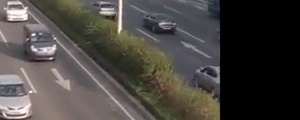

cam2


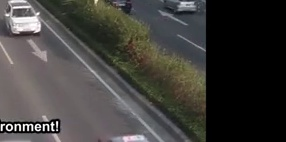

cam2


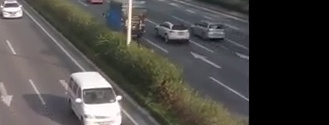

cam2


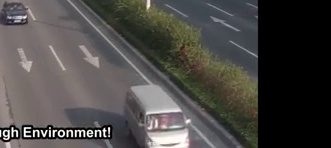

cam2


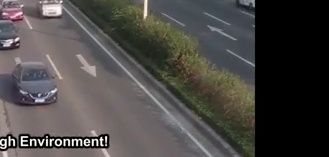

cam2


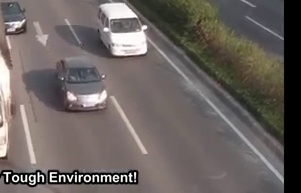

cam2


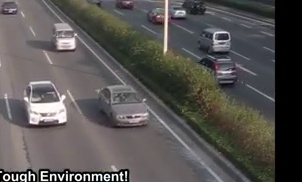

cam2


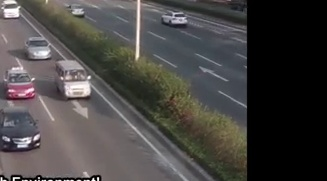

cam2


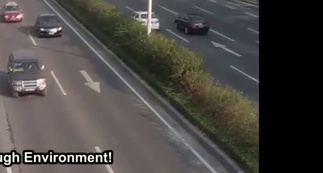

cam2


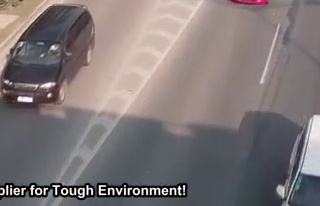

cam2


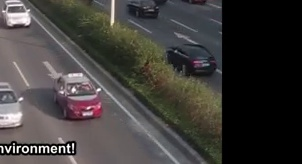

cam2


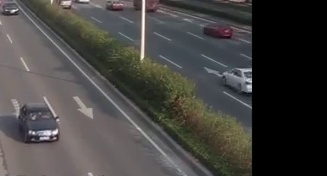

cam2


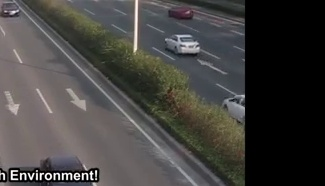

cam2


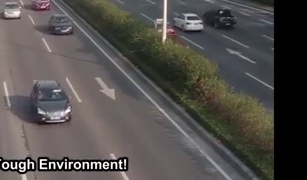

cam2


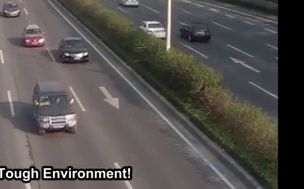

cam2


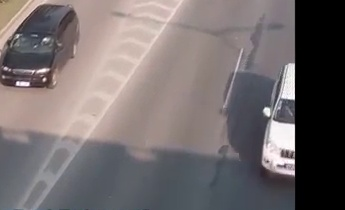

cam2


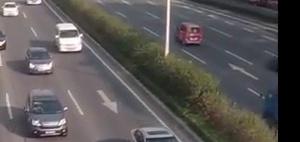

cam2


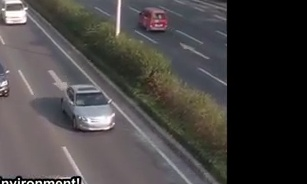

cam2


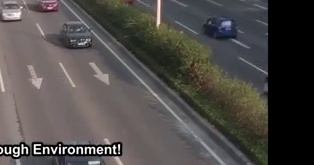

cam2


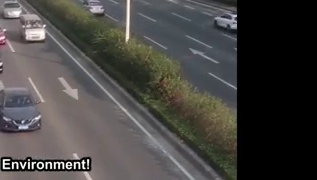

cam2


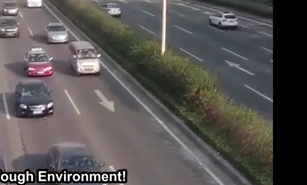

cam2


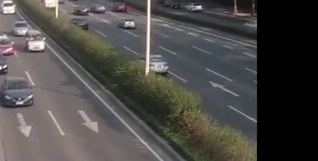

cam2


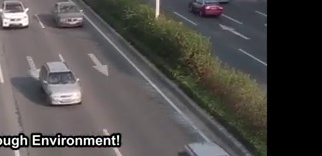

cam2


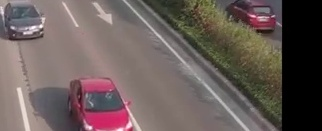

cam2


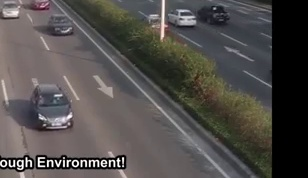

cam2


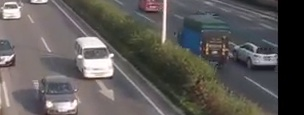

cam2


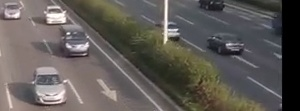

cam2


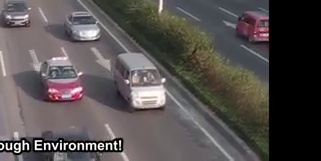

cam2


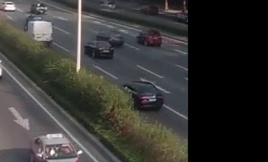

cam2


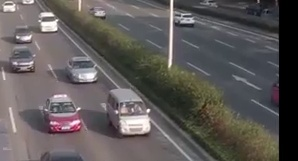

cam2


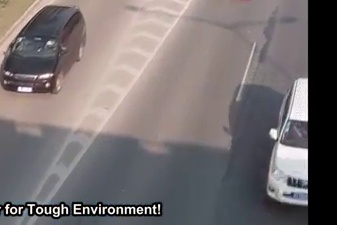

cam2


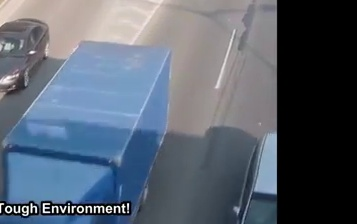

cam2


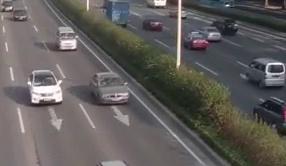

cam2


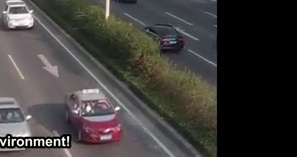

cam2


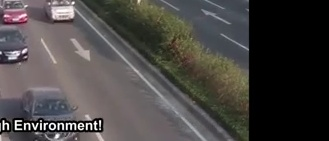

cam2


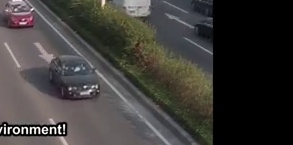

cam2


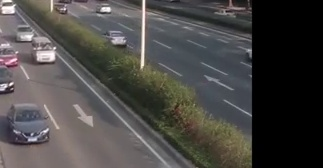

cam2


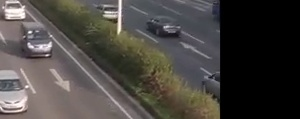

cam2


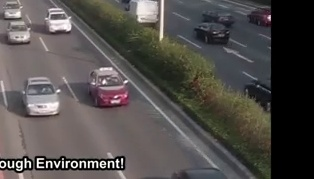

cam2


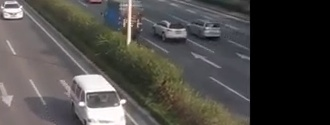

cam2


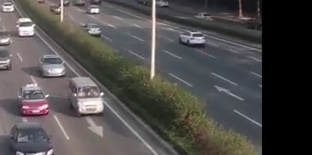

cam2


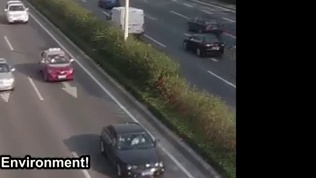

cam2


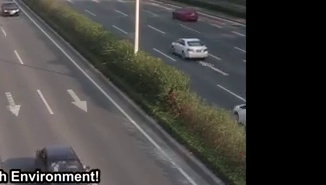

cam2


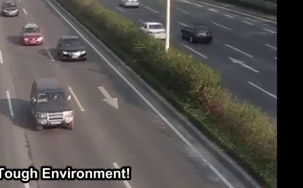

cam2


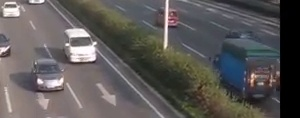

cam2


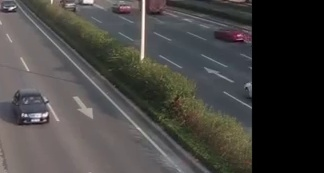

cam2


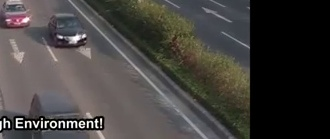

cam2


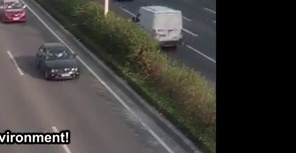

cam2


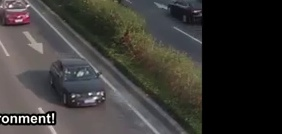

cam2


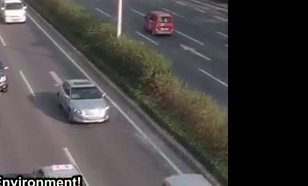

cam2


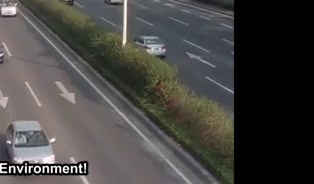

cam2


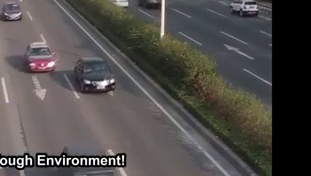

cam2


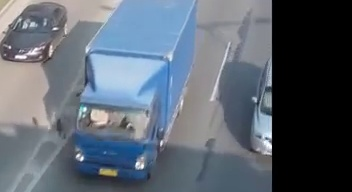

cam2


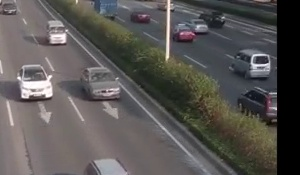

cam2


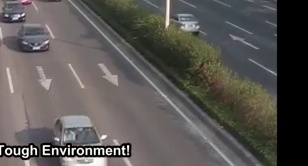

cam2


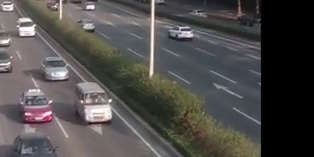

cam2


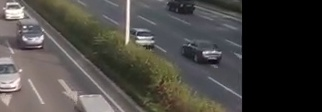

cam2


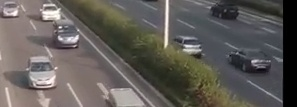

cam2


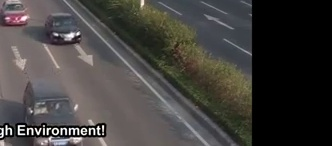

cam2


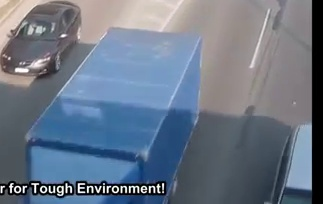

cam2


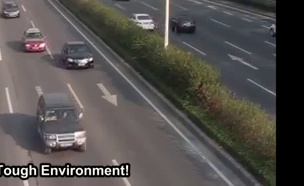

cam2


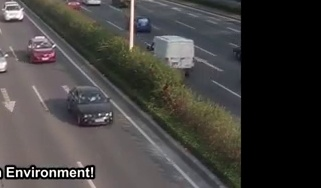

cam2


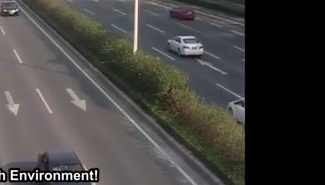

cam2


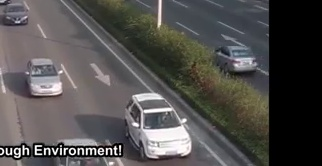

cam2


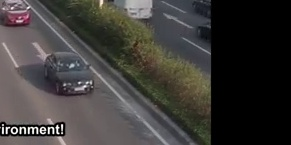

cam2


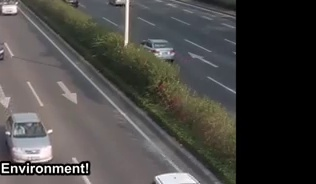

cam2


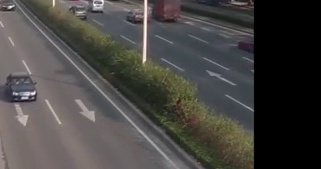

cam2


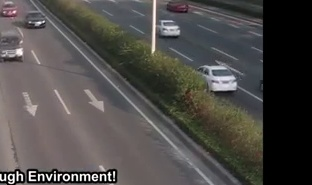

cam2


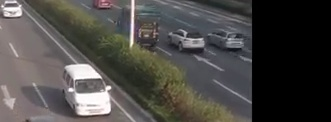

cam2


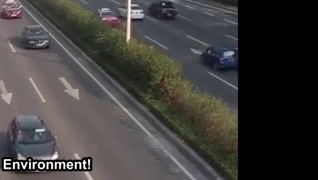

cam2


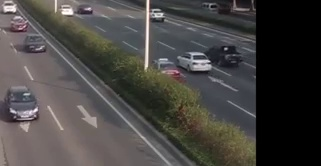

cam2


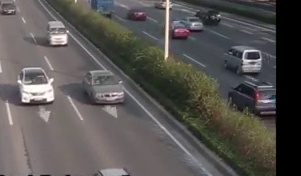

cam2


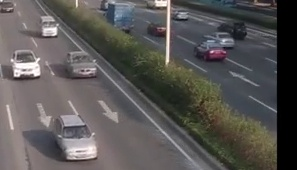

cam2


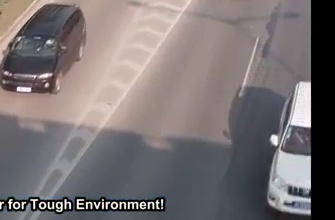

cam2


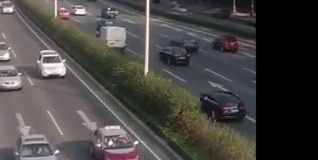

cam2


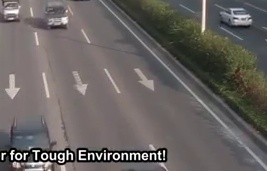

cam2


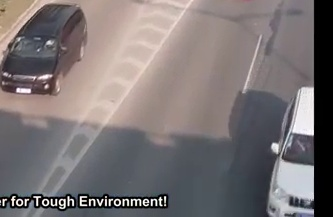

cam2


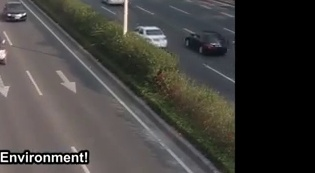

cam2


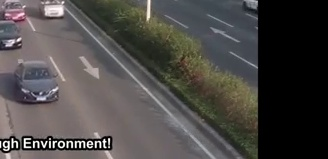

cam2


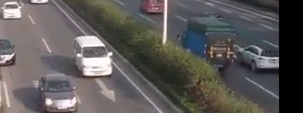

cam2


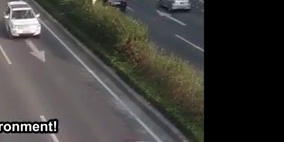

cam2


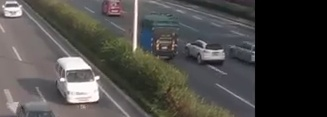

cam2


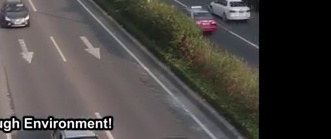

cam2


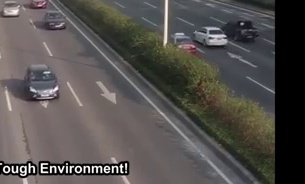

cam2


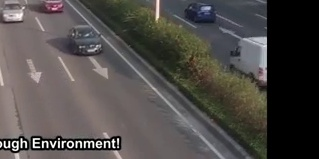

cam2


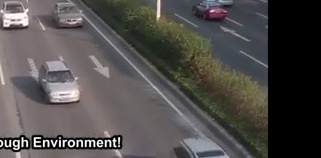

cam2


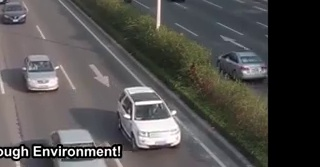

cam2


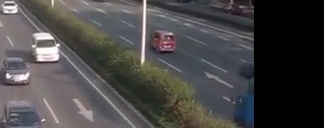

cam2


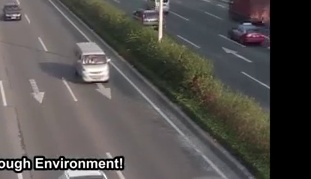

cam2


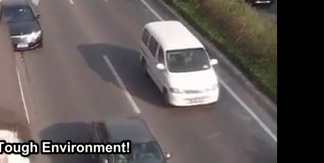

cam2


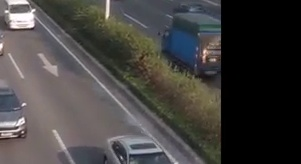

cam2


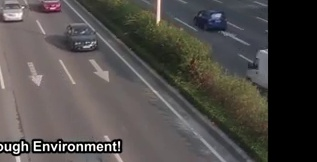

cam2


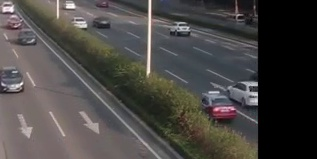

cam2


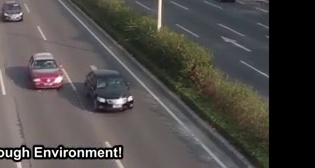

cam2


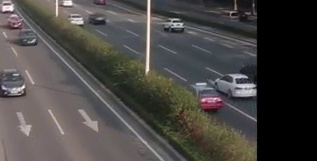

cam2


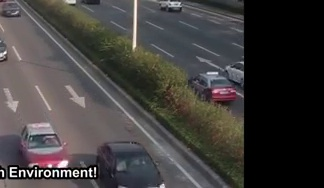

cam2


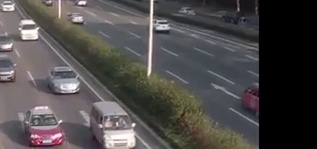

cam2


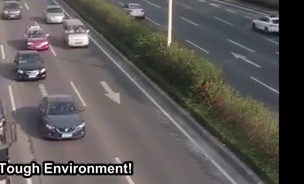

cam2


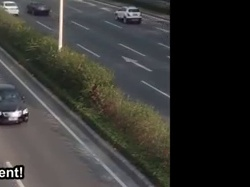

cam2


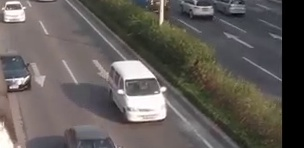

cam2


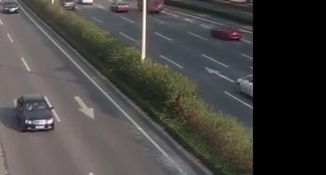

cam2


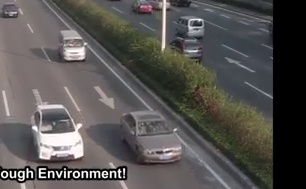

cam2


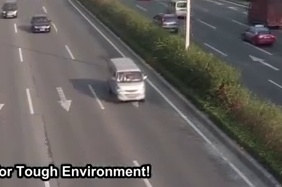

cam2


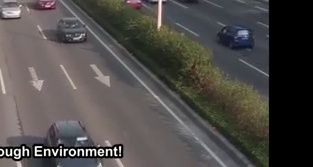

cam2


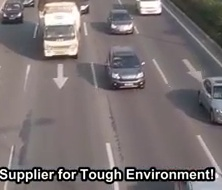

cam2


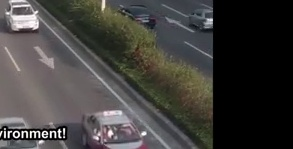

cam2


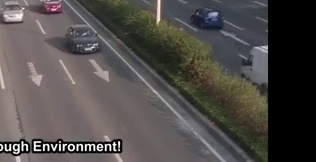

cam2


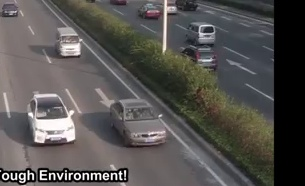

cam2


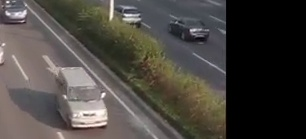

cam2


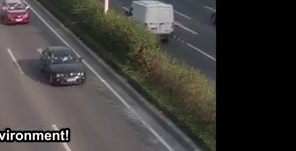

cam2


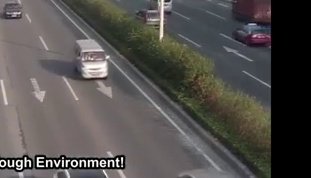

cam2


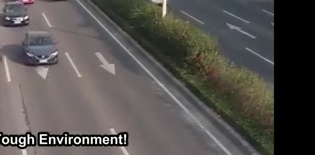

cam2


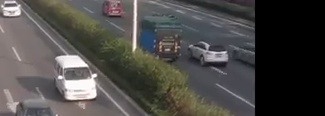

cam2


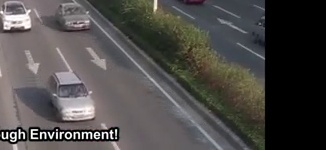

cam2


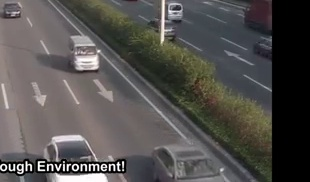

cam2


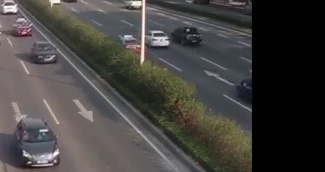

cam2


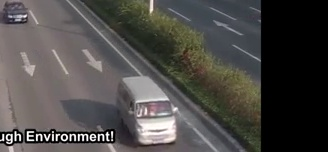

cam2


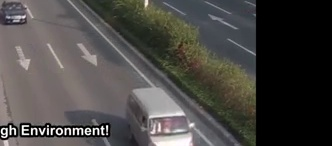

cam2


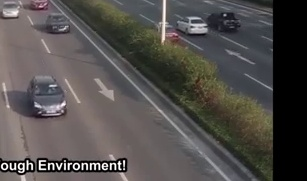

cam2


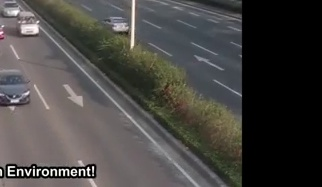

cam2


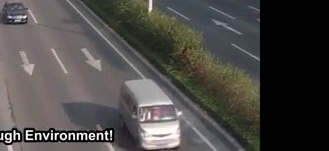

cam2


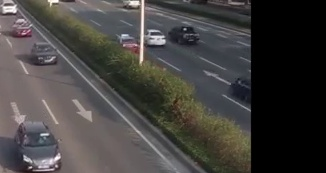

cam2


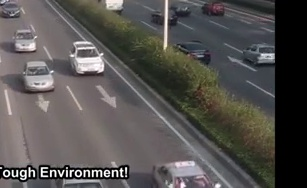

cam2


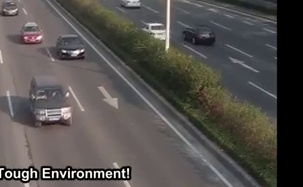

cam2


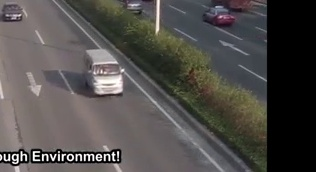

cam2


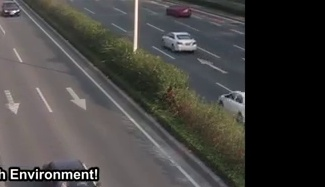

cam2


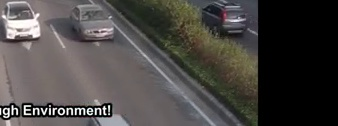

cam2


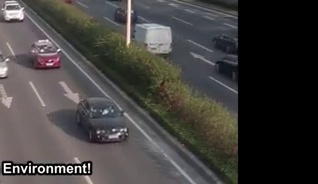

cam2


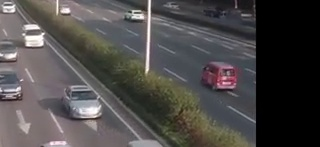

cam2


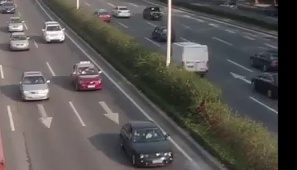

cam2


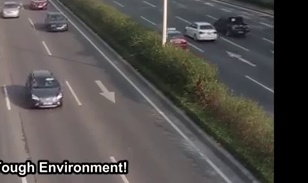

cam2


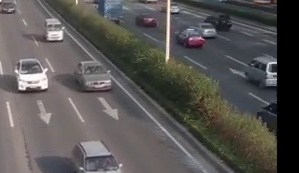

cam2


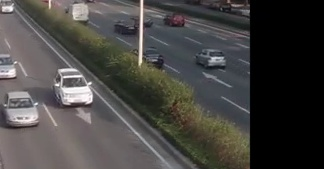

cam2


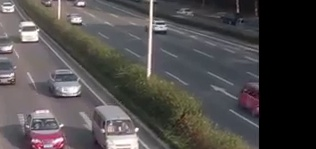

cam2


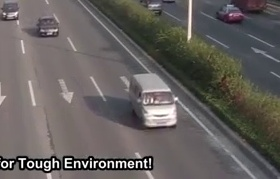

cam2


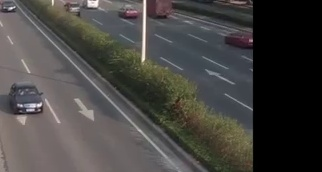

cam2


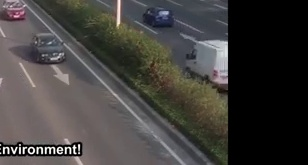

cam2


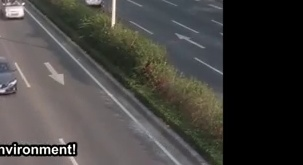

cam2


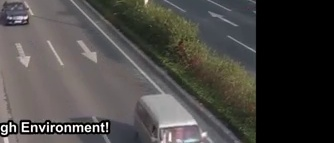

cam2


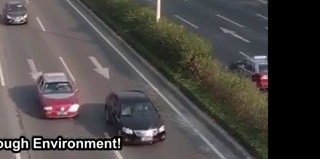

cam2


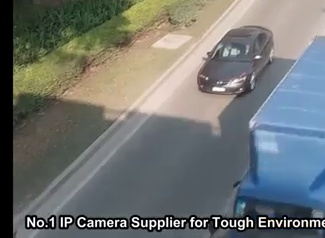

cam2


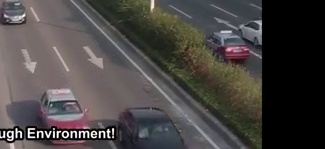

cam2


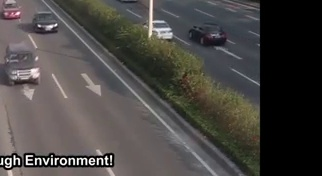

cam2


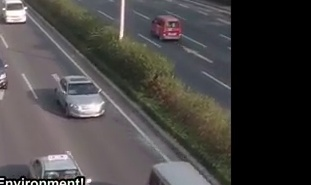

cam2


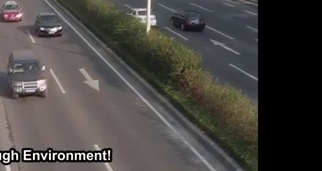

cam2


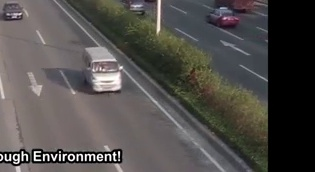

cam2


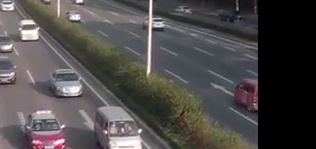

cam2


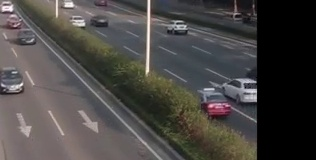

cam2


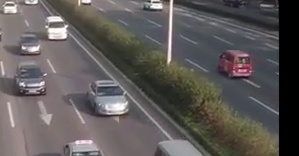

cam2


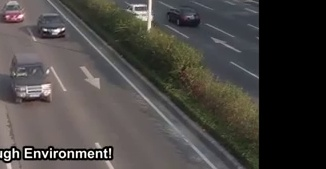

cam2


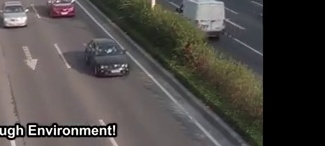

cam2


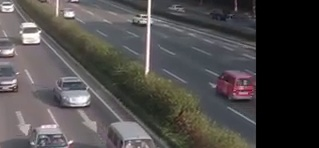

cam2


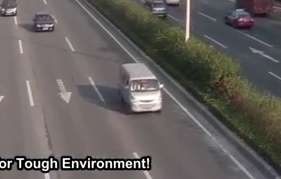

cam2


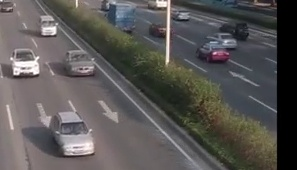

cam2


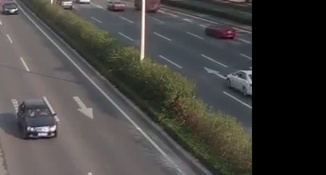

cam2


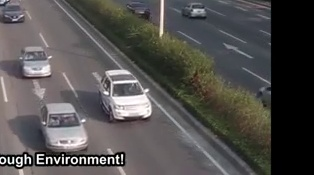

cam2


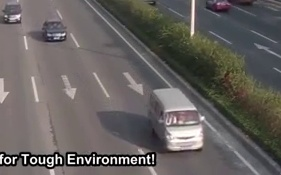

cam2


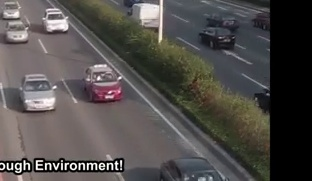

cam2


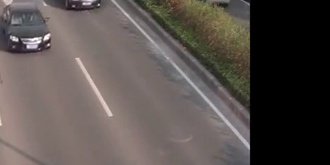

cam2


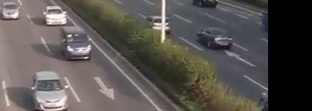

cam2


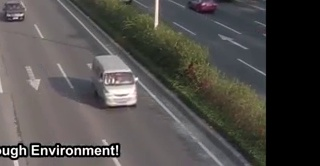

cam2


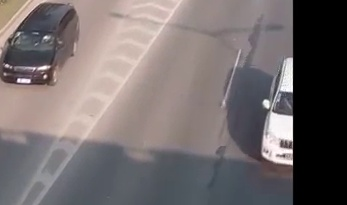

cam2


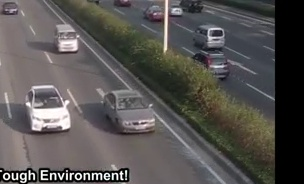

cam2


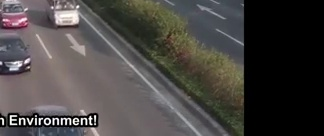

cam2


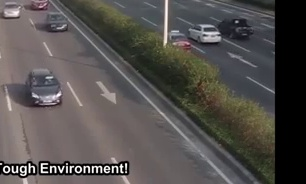

cam2


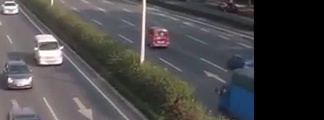

cam2


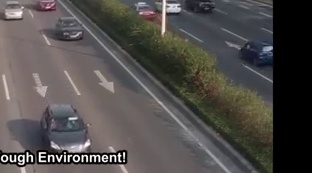

cam2


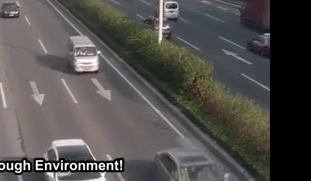

cam2


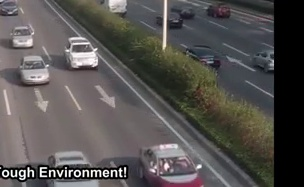

cam2


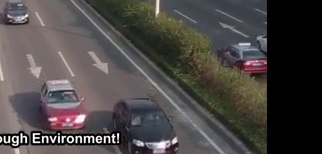

cam2


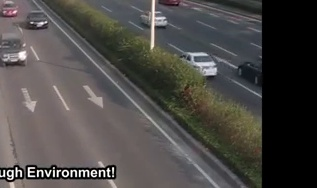

cam2


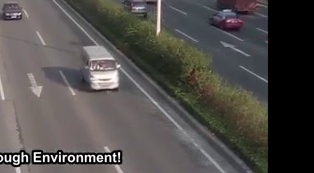

cam2


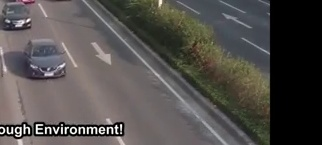

cam2


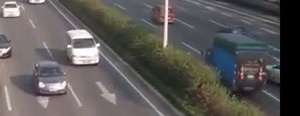

cam2


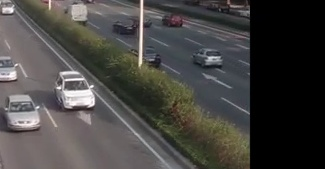

cam2


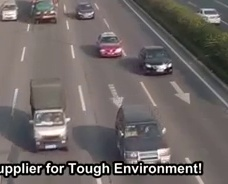

cam2


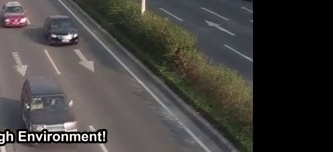

cam2


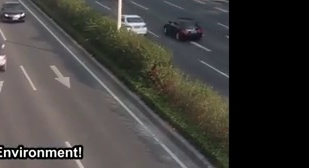

cam2


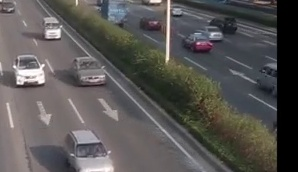

cam2


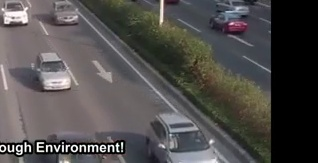

cam2


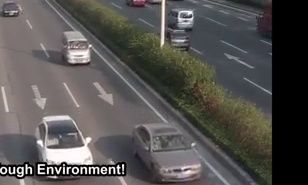

cam2


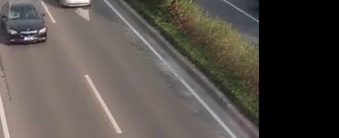

cam2


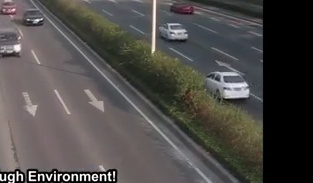

cam2


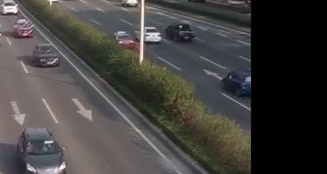

cam2


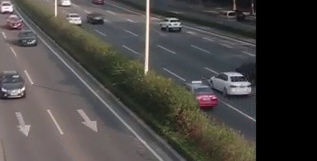

cam2


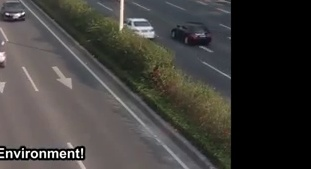

cam2


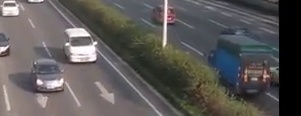

cam2


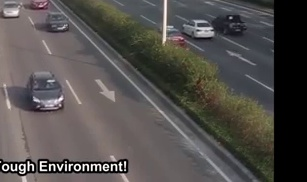

cam2


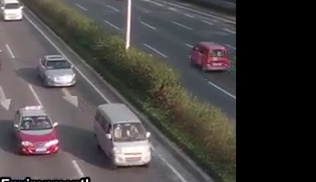

cam2


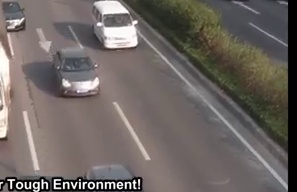

cam2


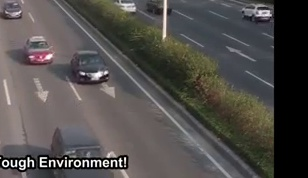

cam2


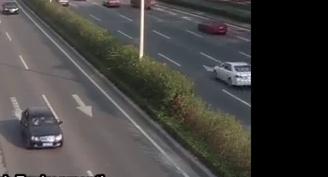

cam2


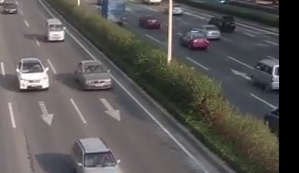

cam2


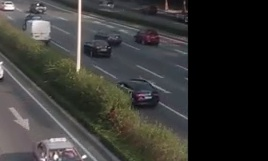

cam2


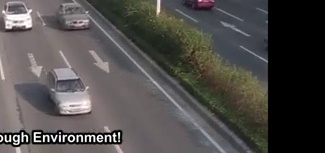

cam2


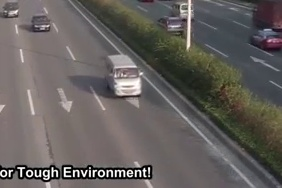

cam2


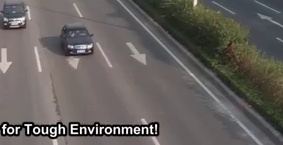

cam2


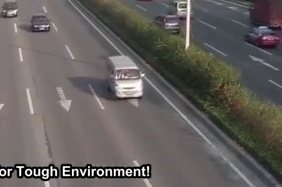

cam2


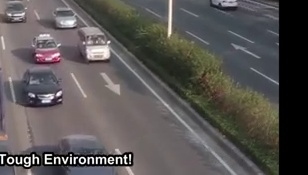

cam2


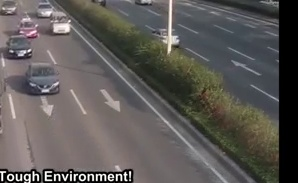

cam2


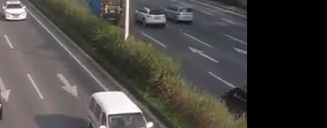

cam2


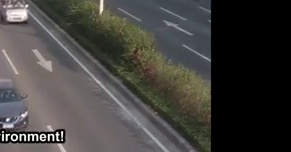

cam2


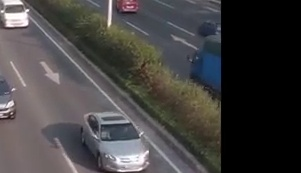

cam2


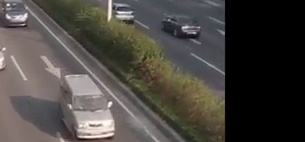

cam2


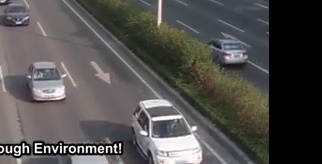

cam2


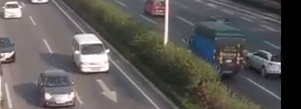

cam2


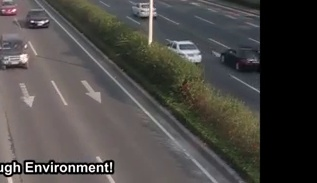

cam2


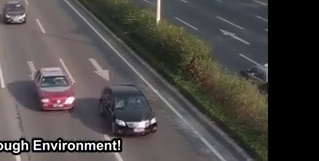

cam2


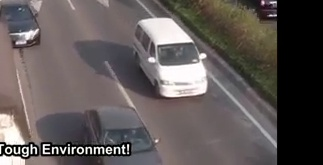

cam2


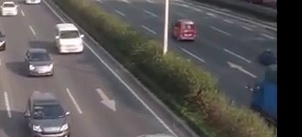

cam2


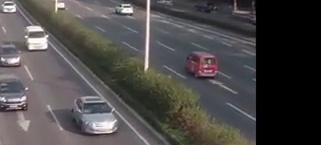

cam2


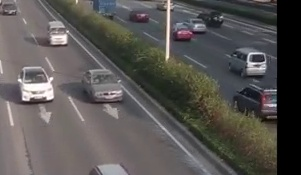

cam2


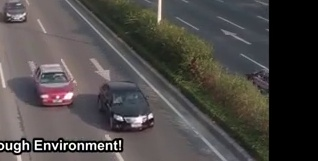

cam2


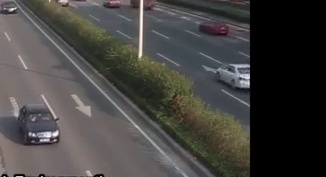

cam2


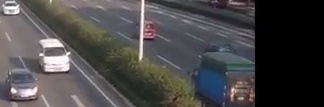

cam2


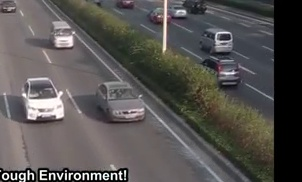

cam2


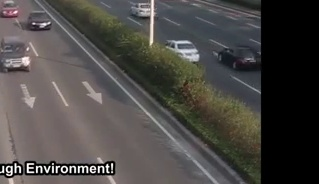

cam2


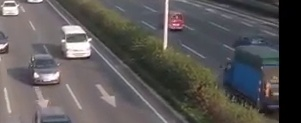

cam2


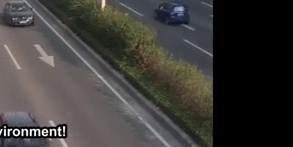

cam2


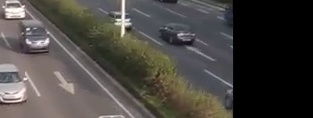

cam2


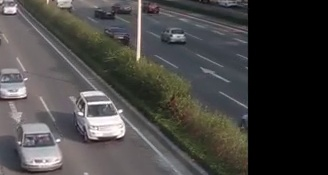

cam2


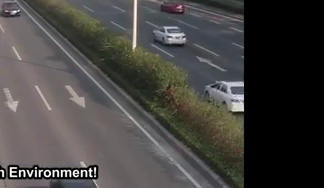

cam2


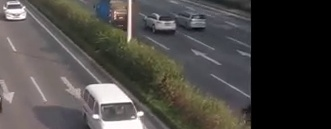

cam2


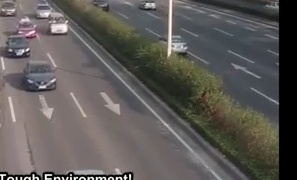

cam2


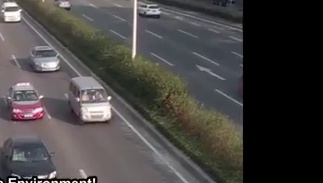

cam2


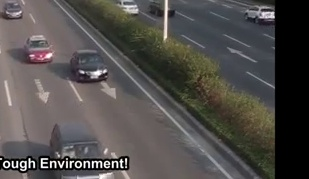

cam2


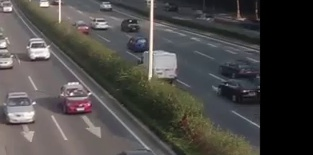

cam2


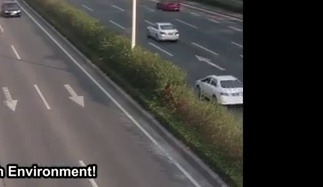

cam2


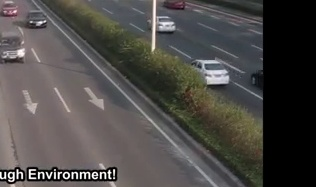

cam2


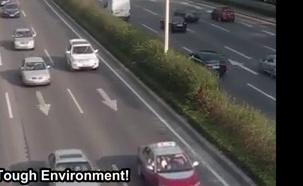

cam2


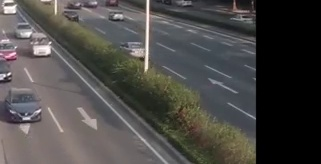

cam2


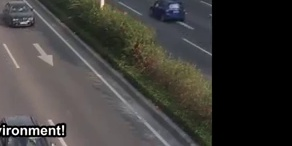

cam2


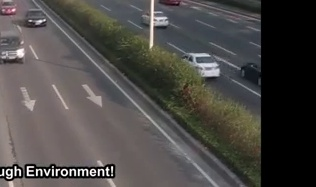

cam2


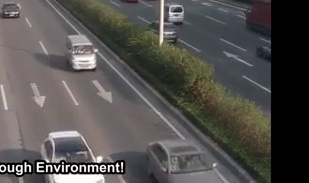

cam2


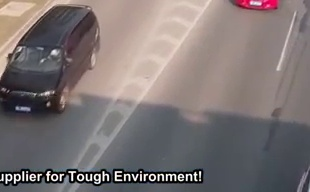

cam2


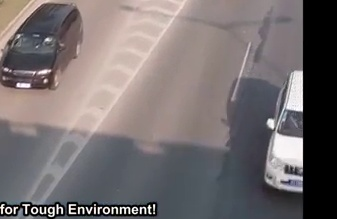

cam2


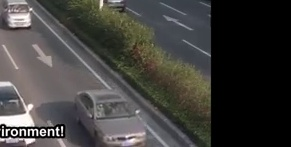

cam2


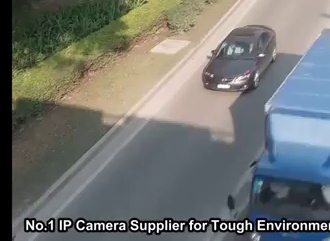

cam2


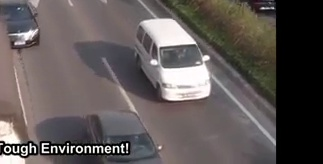

cam2


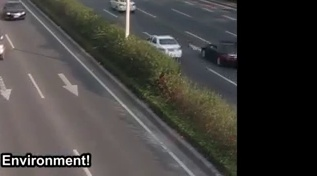

cam2


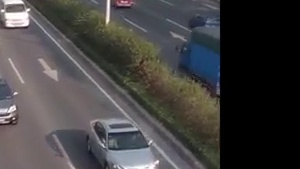

cam2


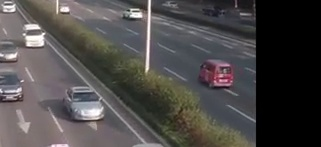

cam2


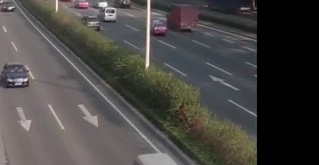

cam2


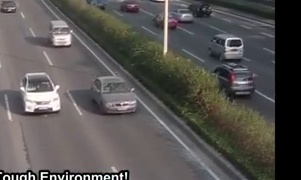

cam2


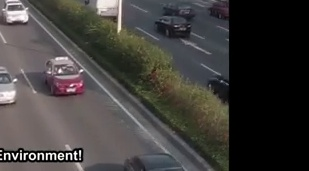

cam2


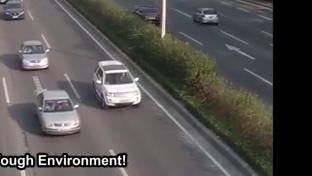

cam2


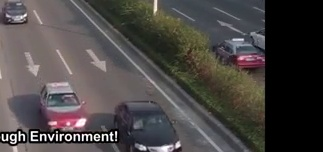

cam2


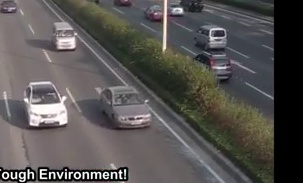

cam2


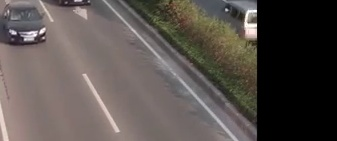

cam2


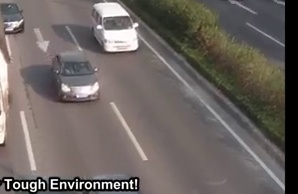

cam2


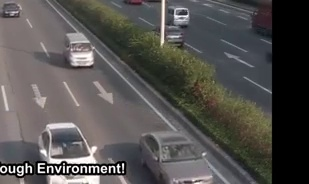

cam2


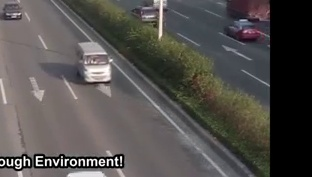

cam2


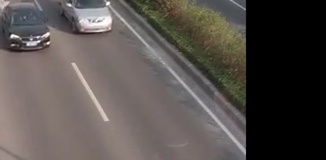

cam2


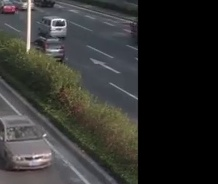

cam2


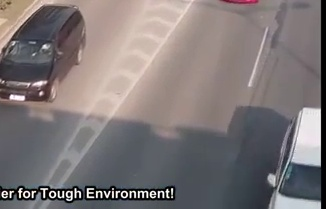

cam2


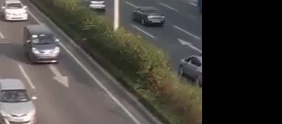

cam2


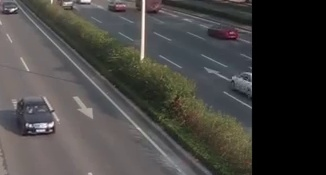

cam2


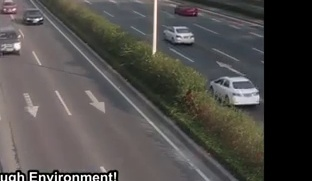

cam2


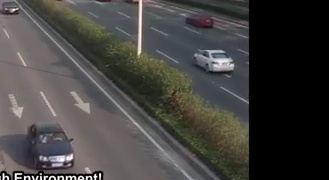

cam2


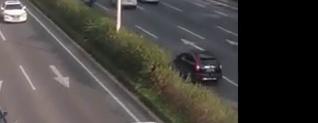

cam2


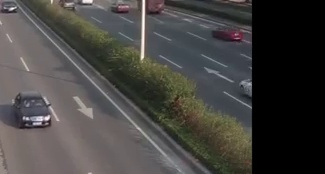

cam2


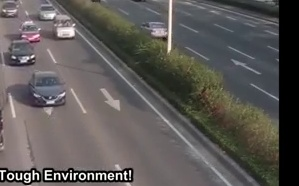

cam2


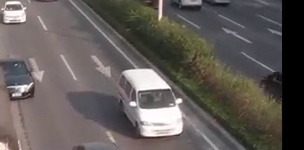

cam2


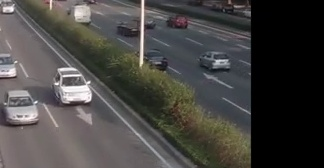

cam2


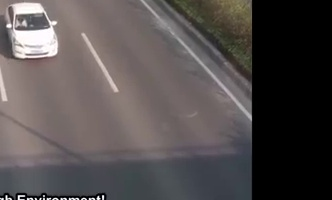

cam2


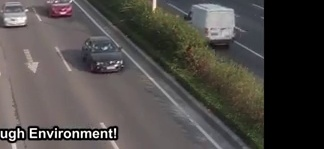

cam2


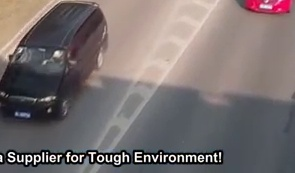

cam2


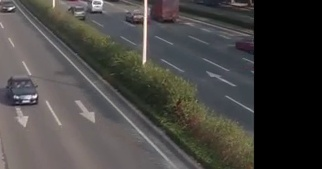

cam2


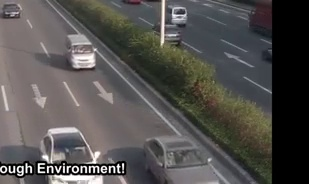

cam2


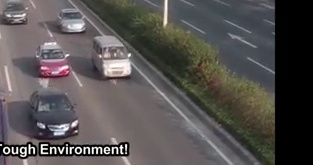

cam2


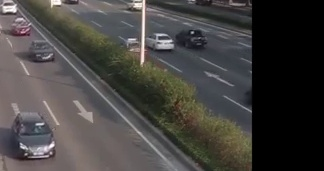

cam2


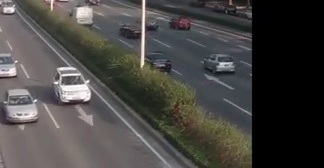

cam2


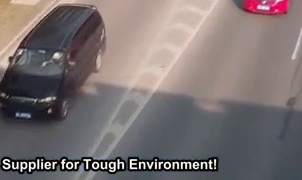

cam2


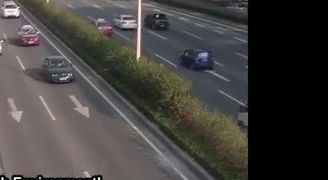

cam2


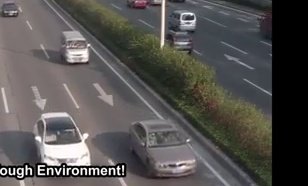

cam2


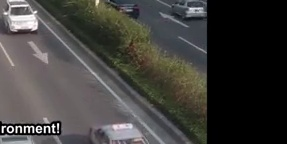

cam2


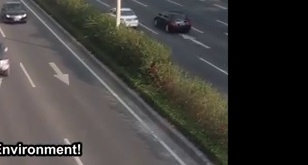

cam2


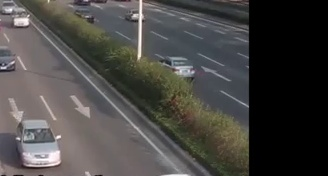

cam2


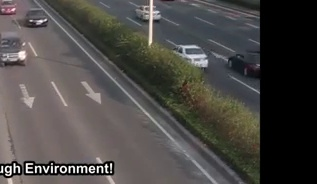

cam2


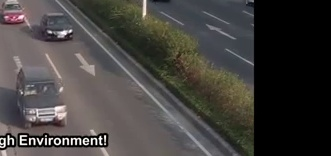

cam2


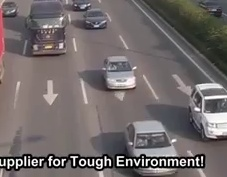

cam2


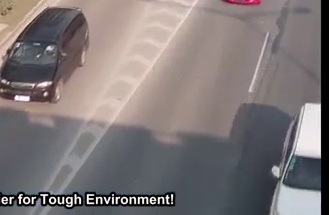

cam2


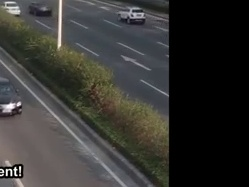

cam2


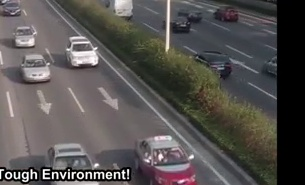

cam2


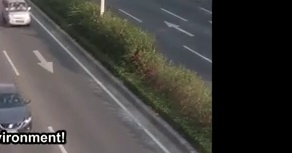

cam2


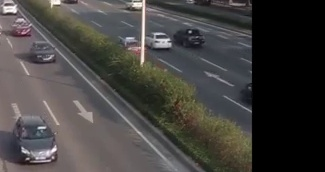

cam2


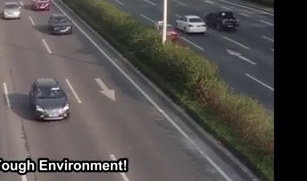

cam2


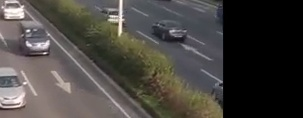

cam2


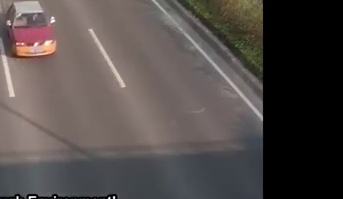

cam2


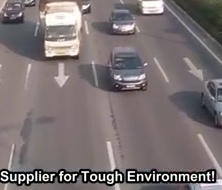

cam2


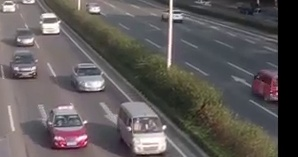

cam2


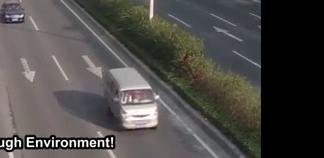

cam2


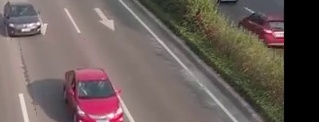

cam2


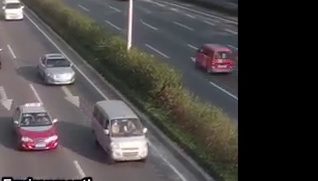

cam2


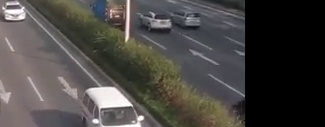

cam2


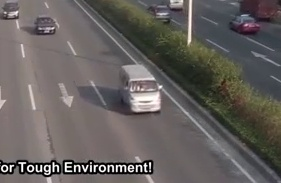

cam2


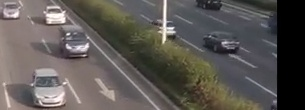

cam2


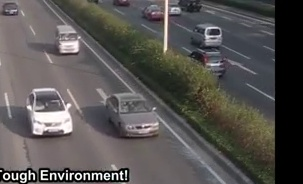

cam2


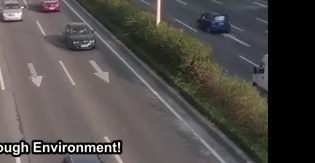

cam2


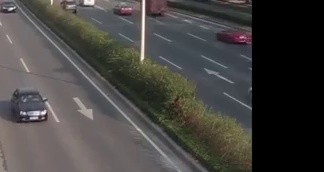

cam2


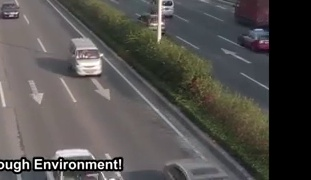

cam2


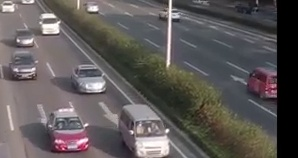

cam2


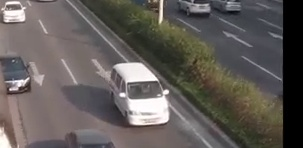

cam2


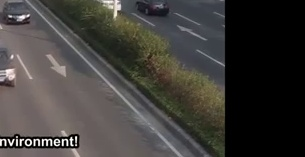

cam2


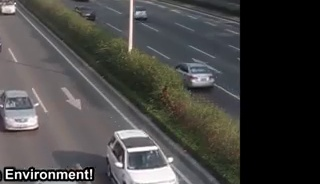

cam2


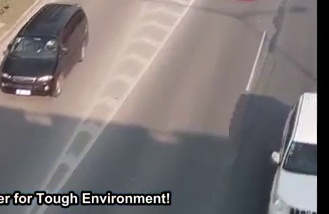

cam2


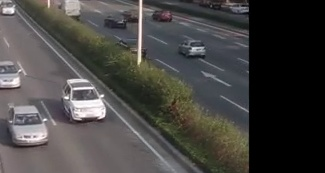

cam2


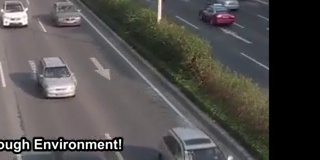

cam2


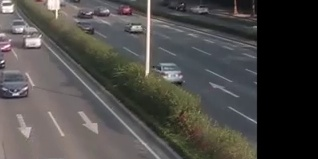

cam2


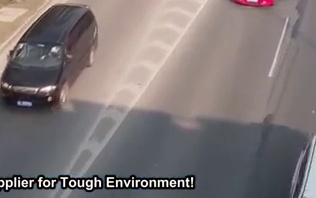

cam2


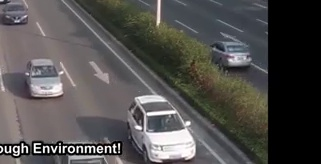

cam2


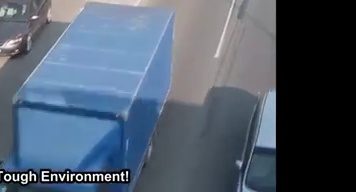

cam2


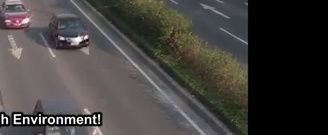

cam2


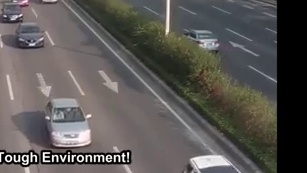

cam2


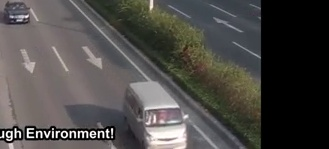

cam2


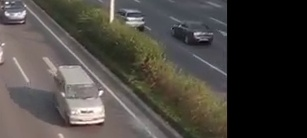

cam2


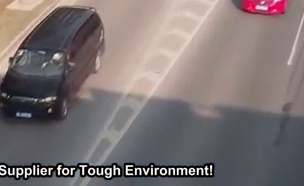

cam2


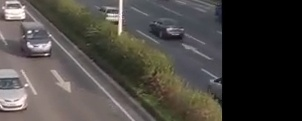

cam2


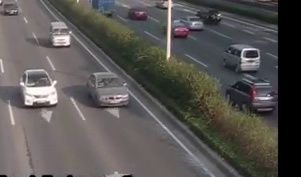

cam2


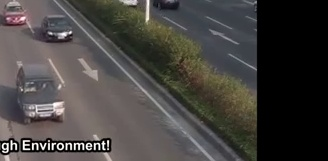

cam2


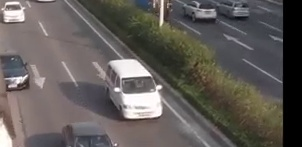

cam2


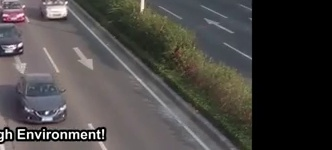

cam2


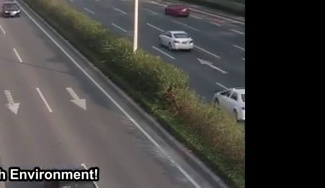

cam2


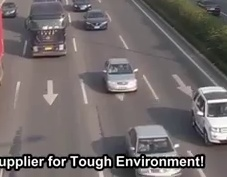

cam2


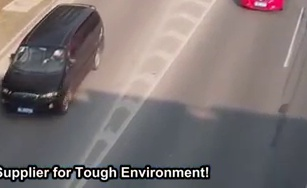

cam2


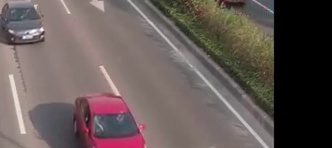

cam2


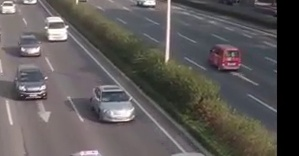

cam2


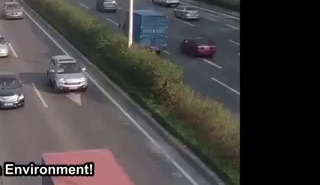

cam2


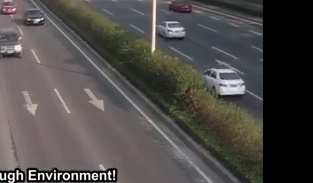

cam2


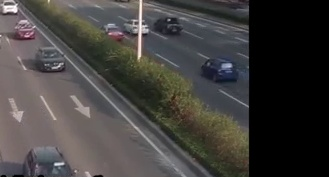

cam2


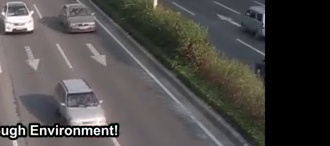

cam2


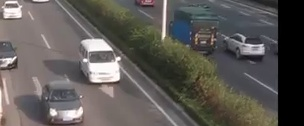

cam2


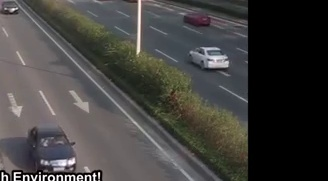

cam2


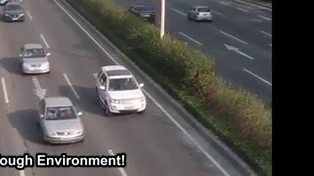

cam2


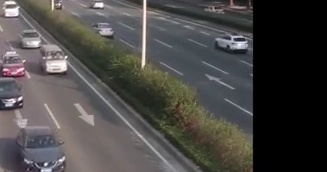

cam2


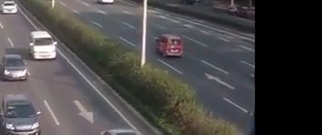

cam2


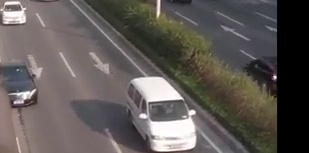

cam2


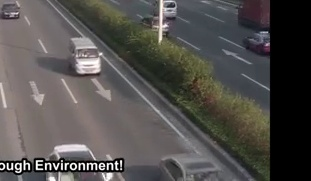

cam2


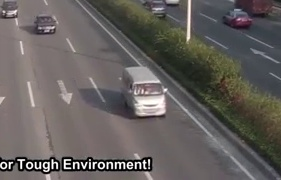

cam2


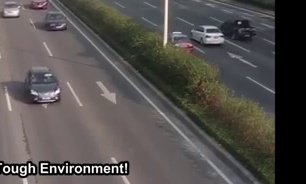

cam2


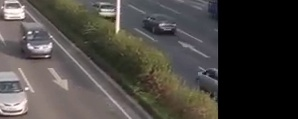

cam2


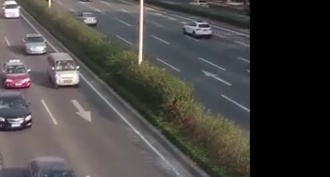

cam2


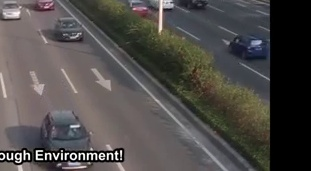

cam2


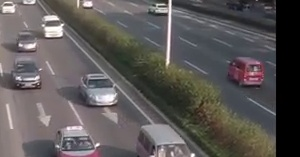

cam2


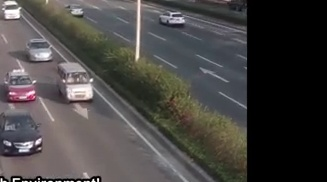

cam2


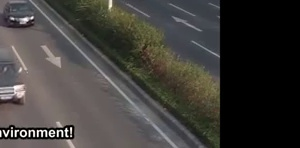

cam2


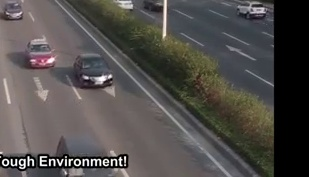

cam2


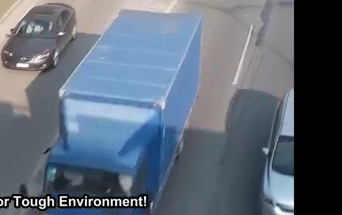

cam2


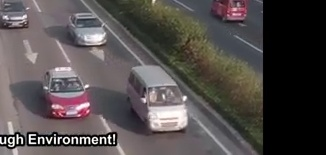

cam2


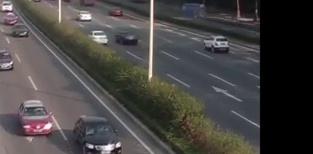

cam2


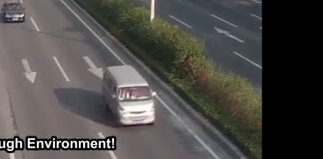

cam2


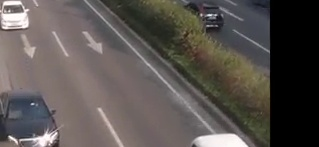

cam2


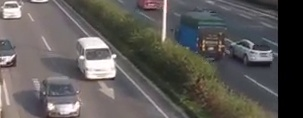

cam2


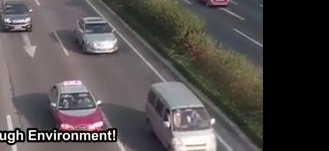

cam2


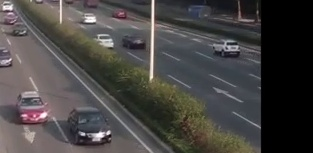

cam2


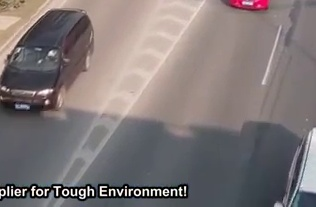

cam2


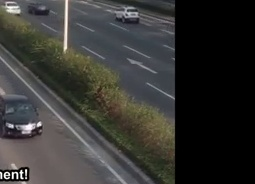

cam2


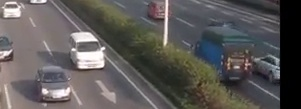

cam2


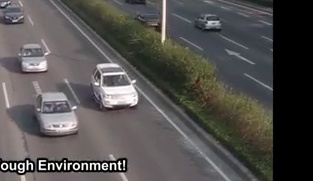

cam2


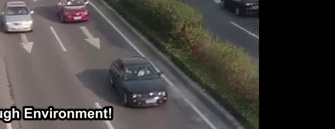

cam2


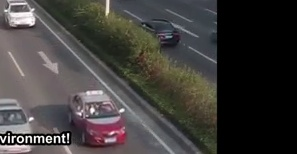

cam2


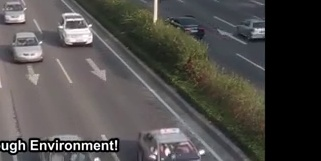

cam2


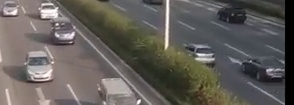

cam2


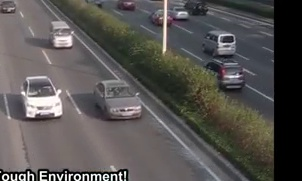

cam2


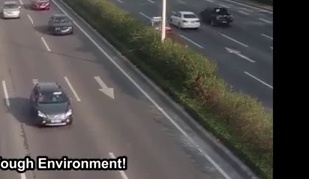

cam2


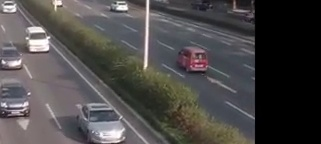

cam2


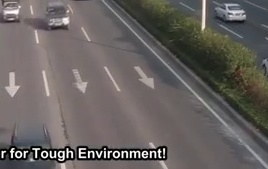

cam2


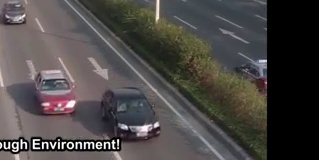

cam2


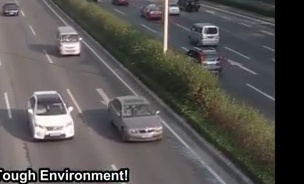

cam2


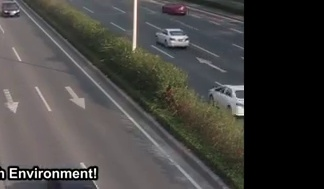

cam2


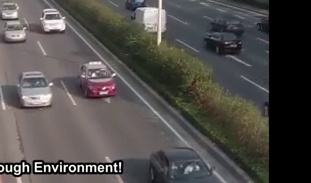

cam2


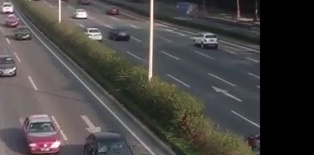

cam2


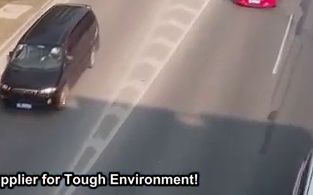

cam2


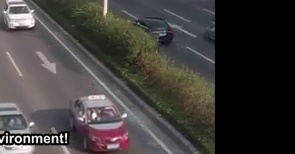

cam2


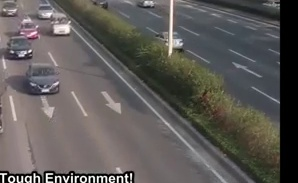

cam2


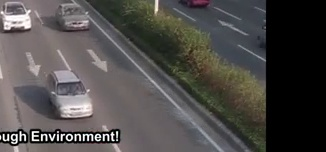

cam2


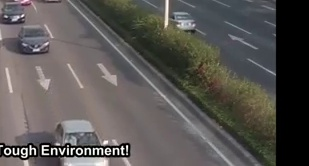

cam2


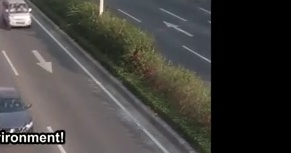

cam2


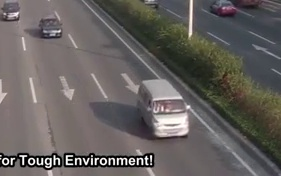

cam2


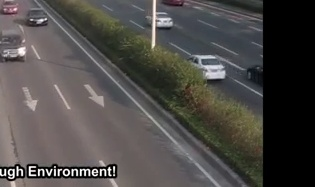

cam2


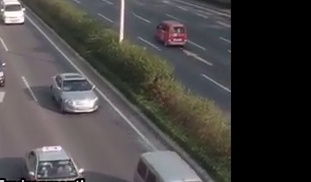

cam2


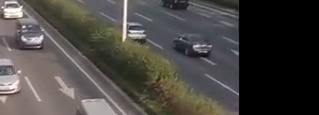

cam2
2


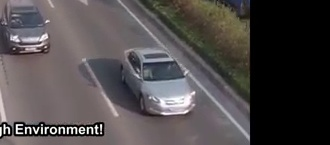

cam2


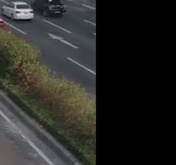

cam2


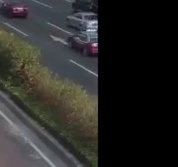

cam2


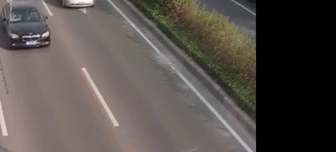

cam2


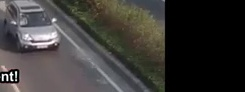

cam2


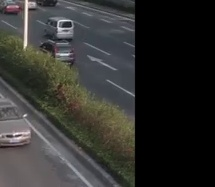

cam2


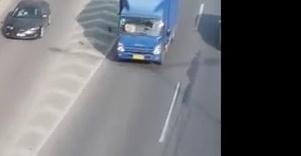

cam2


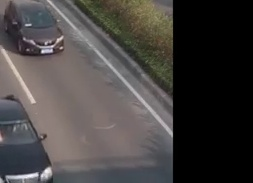

cam2


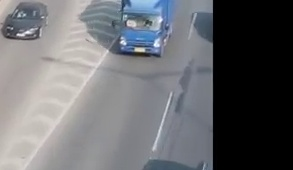

cam2


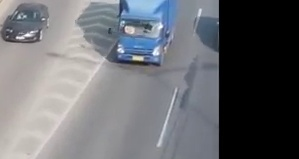

cam2


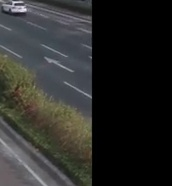

cam2


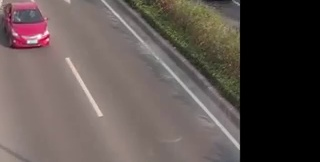

cam2


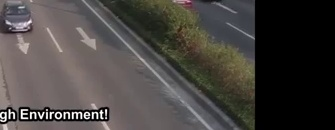

cam2


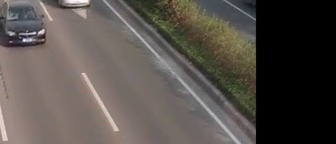

cam2


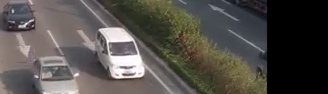

cam2


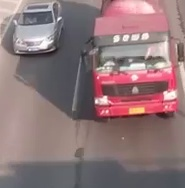

cam2


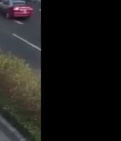

cam2


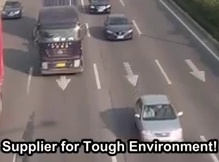

cam2


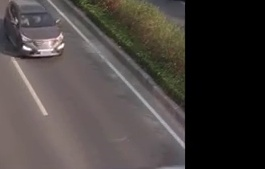

cam2


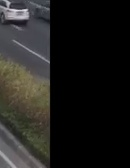

cam2


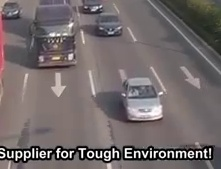

cam2


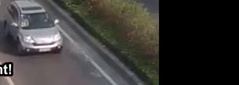

cam2


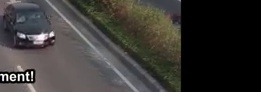

cam2


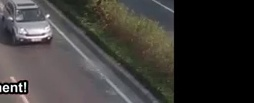

cam2


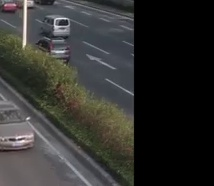

cam2


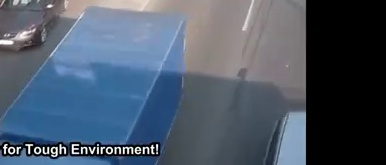

cam2


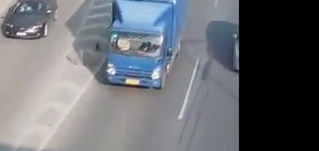

cam2


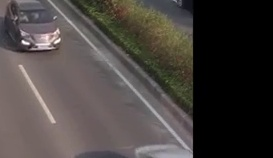

cam2


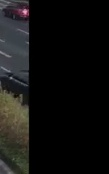

cam2


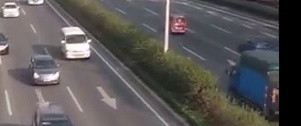

cam2


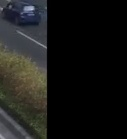

cam2


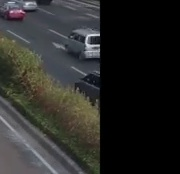

cam2


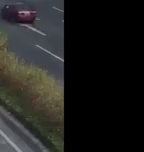

cam2


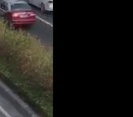

cam2


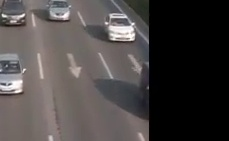

cam2


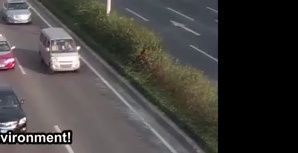

cam2


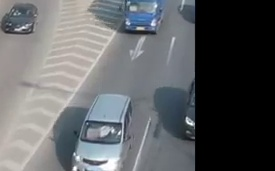

cam2


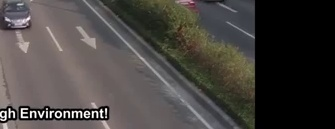

cam2


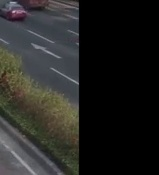

cam2


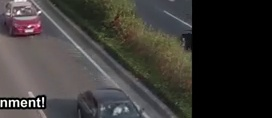

cam2


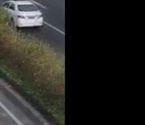

cam2


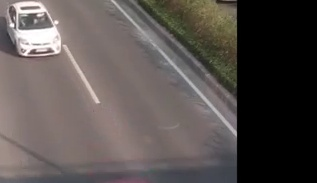

cam2


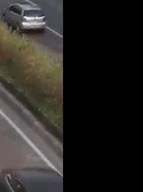

cam2


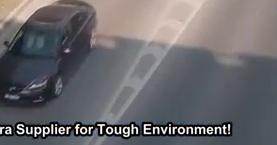

cam2


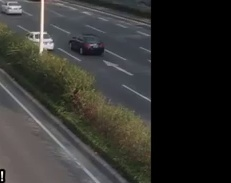

cam2


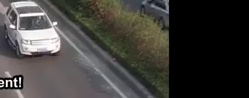

cam2


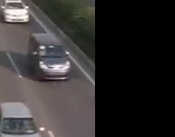

cam2


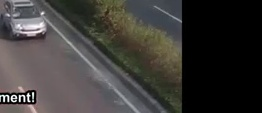

cam2


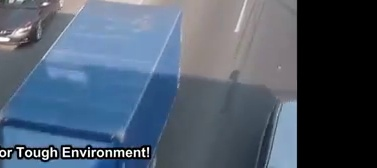

cam2


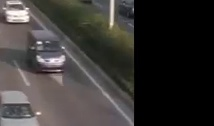

cam2


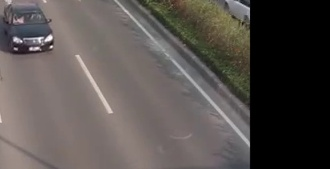

cam2


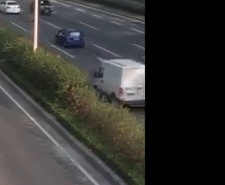

cam2


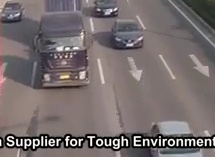

cam2


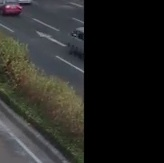

cam2


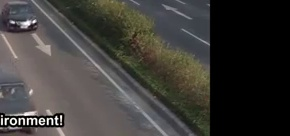

cam2


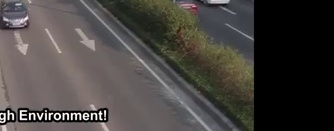

cam2


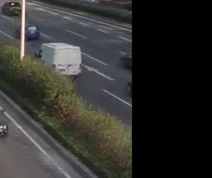

cam2


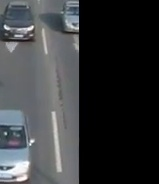

cam2


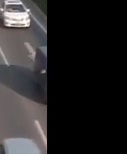

cam2


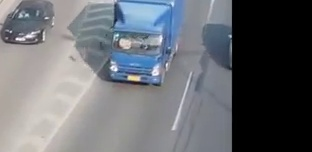

cam2


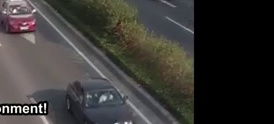

cam2


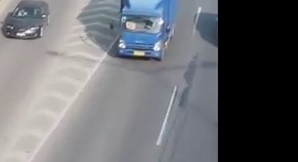

cam2


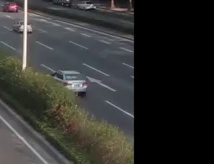

cam2


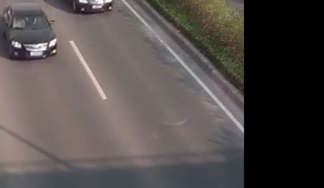

cam2


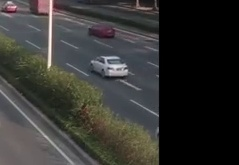

cam2


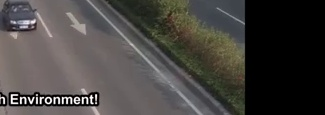

cam2


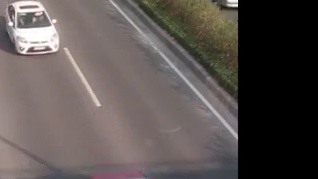

cam2


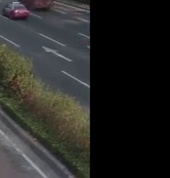

cam2


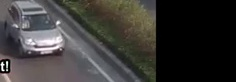

cam2


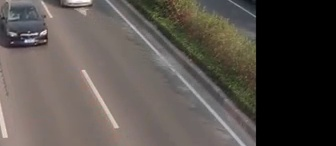

cam2


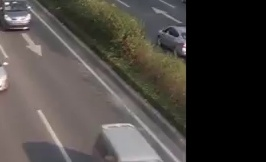

cam2


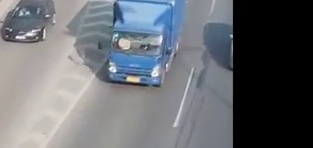

cam2


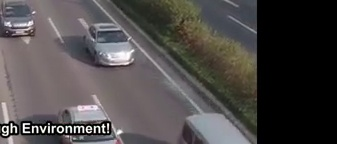

cam2


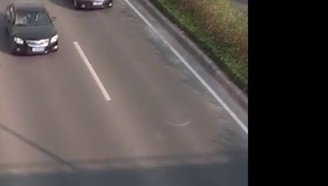

cam2


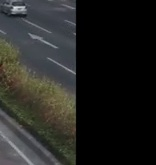

cam2


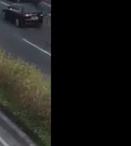

cam2


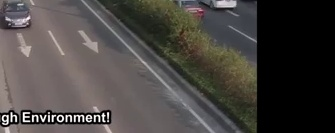

cam2


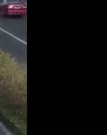

cam2


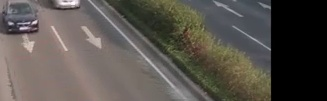

cam2


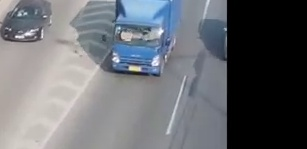

cam2


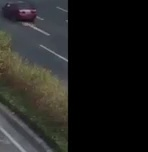

cam2


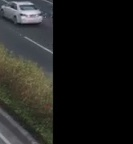

cam2


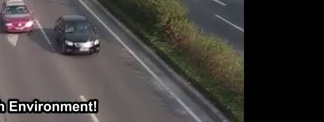

cam2


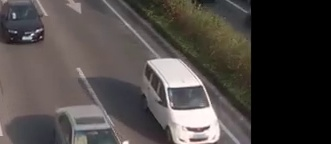

cam2


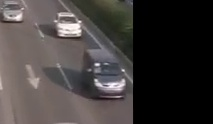

cam2


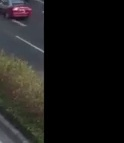

cam2


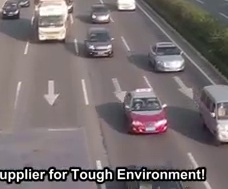

cam2


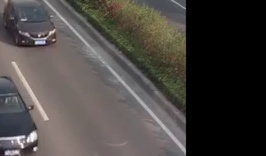

cam2


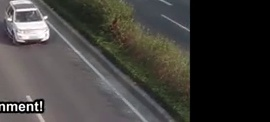

cam2


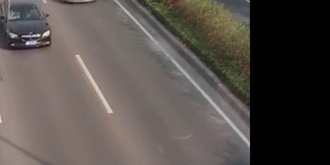

cam2


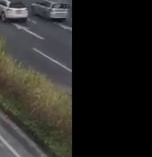

cam2


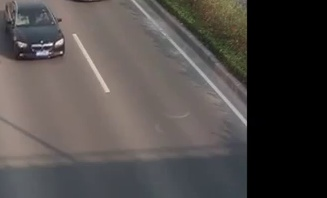

cam2


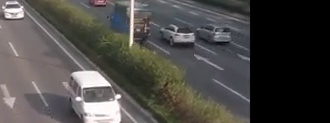

cam2


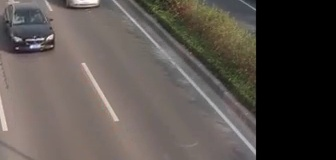

cam2


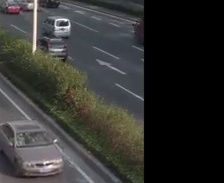

cam2


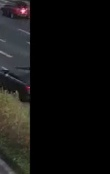

cam2


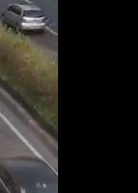

cam2


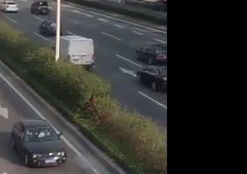

cam2


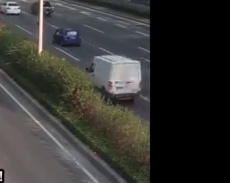

cam2


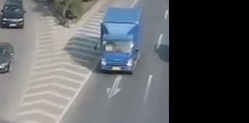

cam2


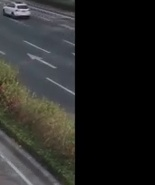

cam2


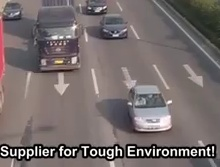

cam2


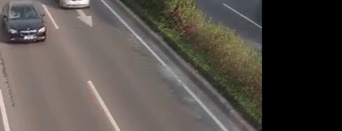

cam2


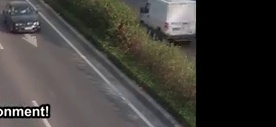

cam2


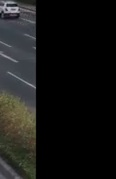

cam2


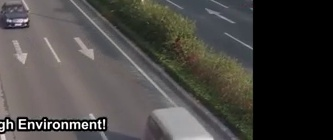

cam2


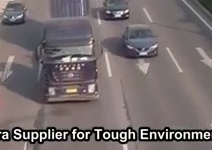

cam2


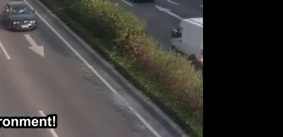

cam2


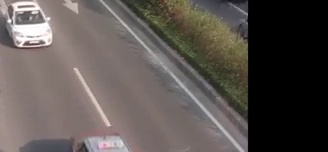

cam2


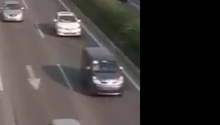

cam2


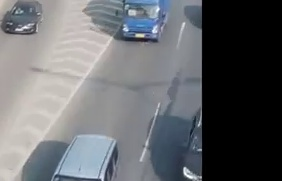

cam2


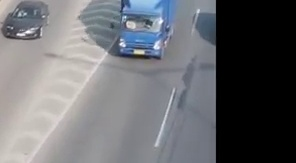

cam2


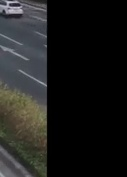

cam2


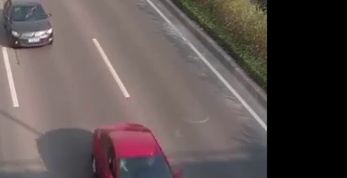

cam2


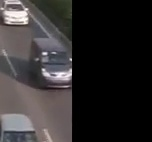

cam2


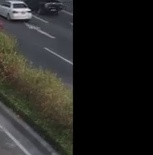

cam2


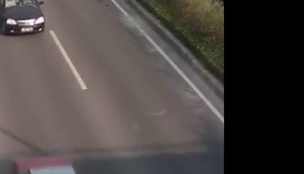

cam2


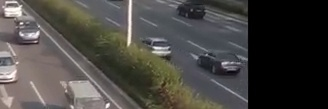

cam2


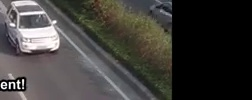

cam2


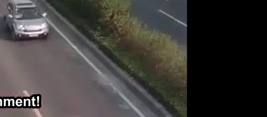

cam2


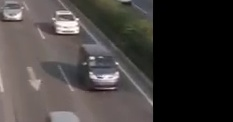

cam2


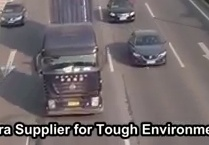

cam2


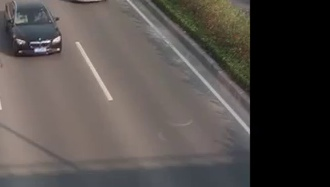

cam2


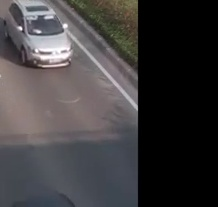

cam2


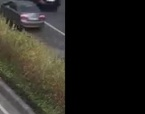

cam2


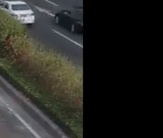

cam2


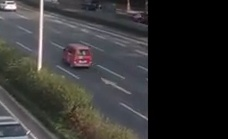

cam2


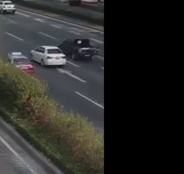

cam2


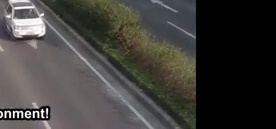

cam2


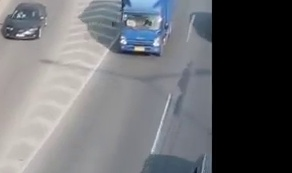

cam2


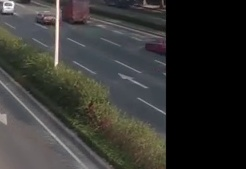

cam2


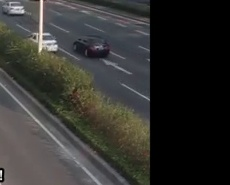

cam2


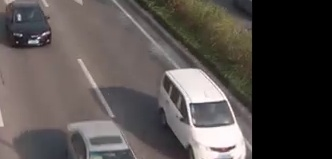

cam2


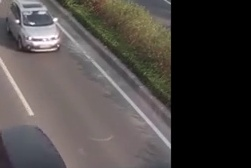

cam2


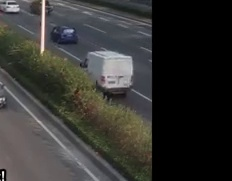

cam2


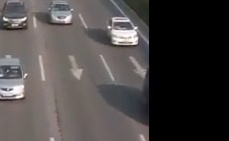

cam2


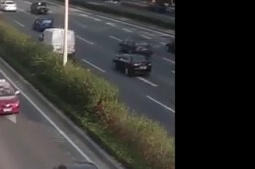

cam2


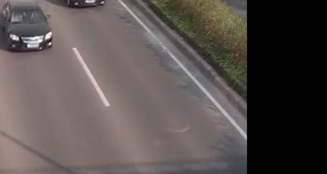

cam2


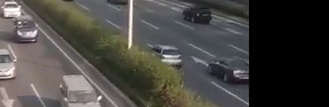

cam2


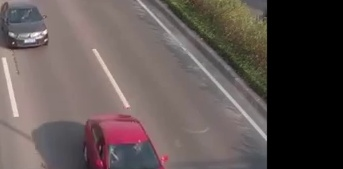

cam2


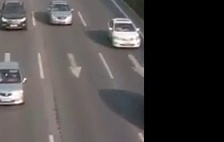

cam2


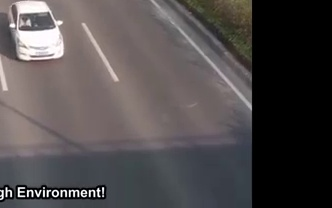

cam2


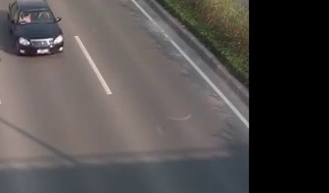

cam2


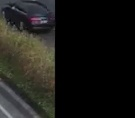

cam2


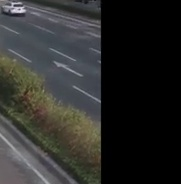

cam2


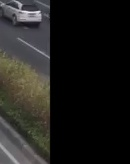

cam2


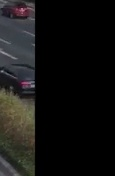

cam2


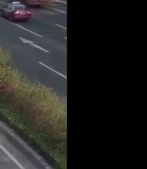

cam2


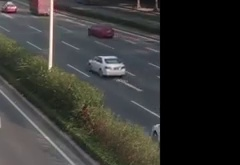

cam2


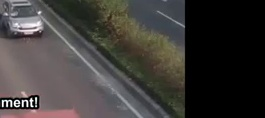

cam2


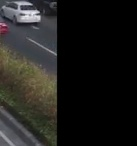

cam2


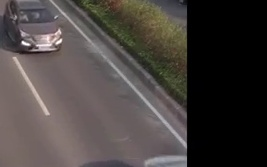

cam2


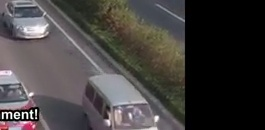

cam2


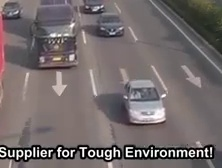

cam2


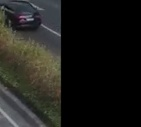

cam2


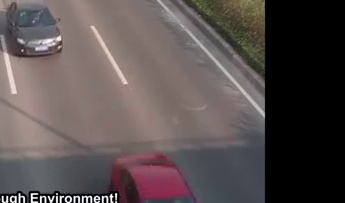

cam2


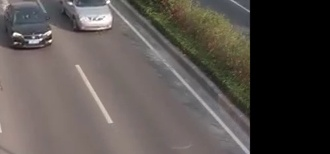

cam2


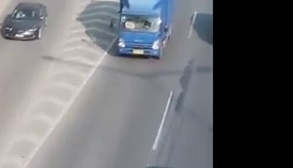

cam2


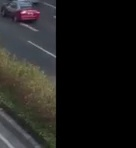

cam2


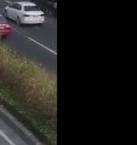

cam2


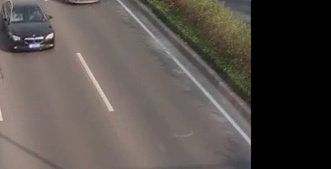

cam2


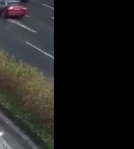

cam2


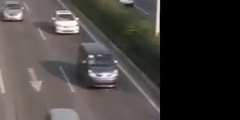

cam2


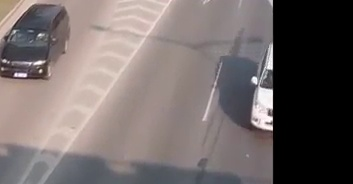

cam2


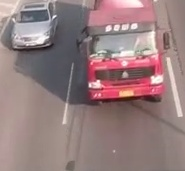

cam2


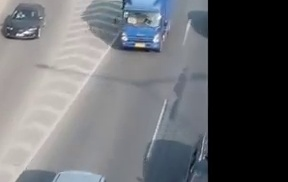

cam2


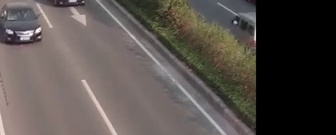

cam2


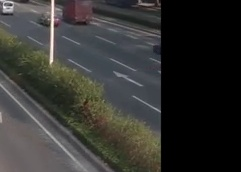

cam2


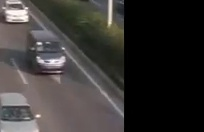

cam2


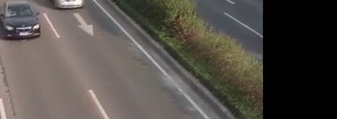

cam2


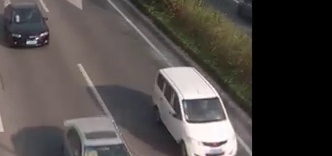

cam2


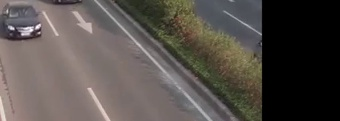

cam2


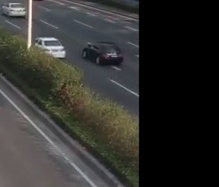

cam2


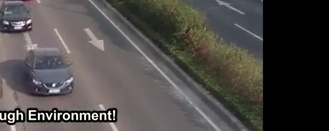

cam2


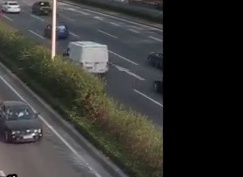

cam2


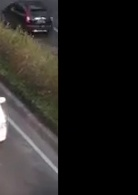

cam2


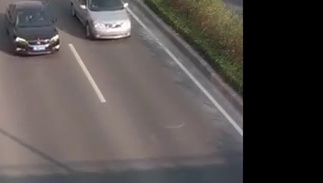

cam2


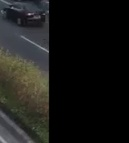

cam2


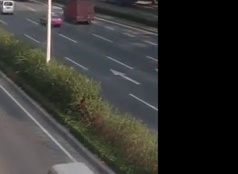

cam2


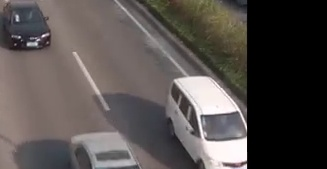

cam2


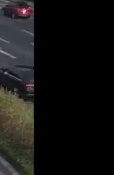

cam2


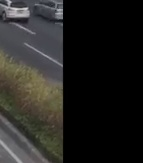

cam2


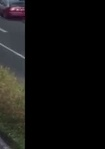

cam2


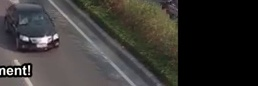

cam2


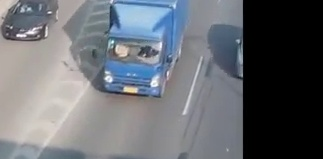

cam2


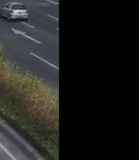

cam2


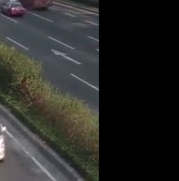

cam2


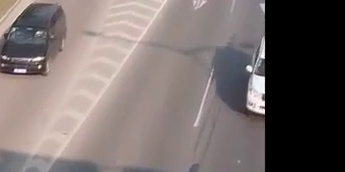

cam2


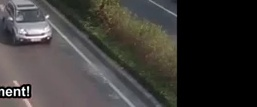

cam2


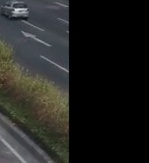

cam2


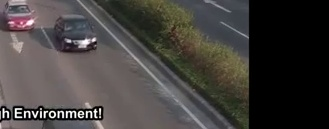

cam2


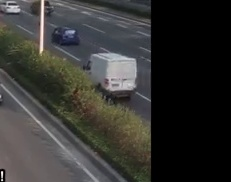

cam2


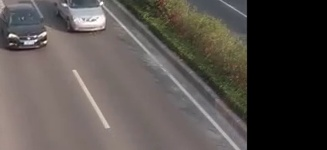

cam2


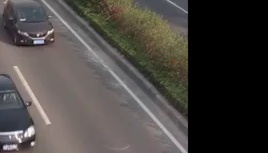

cam2


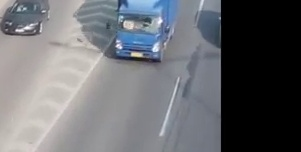

cam2


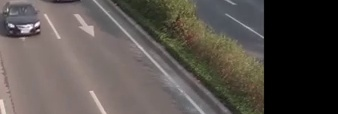

cam2


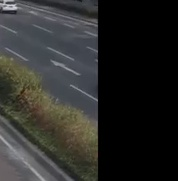

cam2


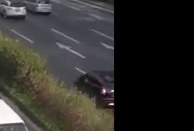

cam2


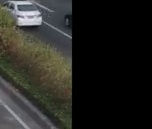

cam2


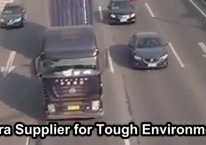

cam2


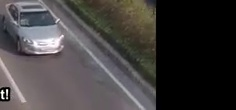

cam2


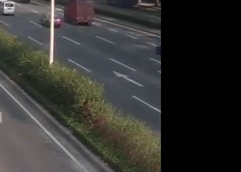

cam2


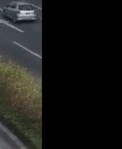

cam2


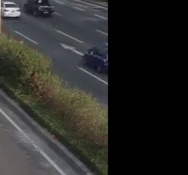

cam2


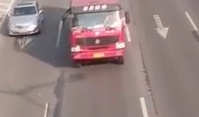

cam2


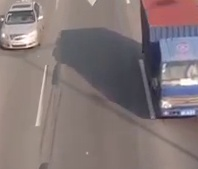

cam2


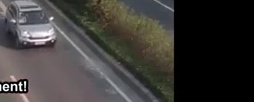

cam2


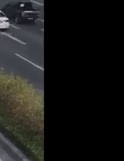

cam2


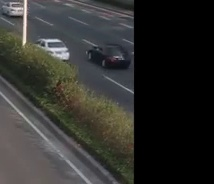

cam2


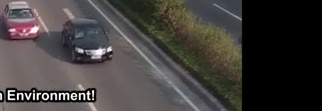

cam2


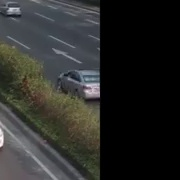

cam2


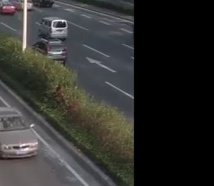

cam2


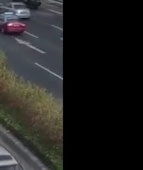

cam2


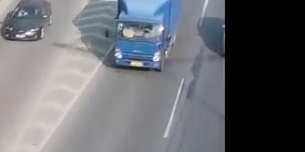

cam2


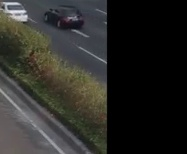

cam2


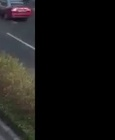

cam2


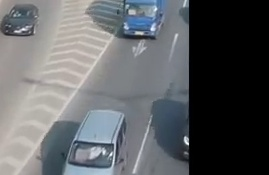

cam2


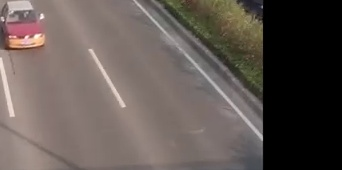

cam2


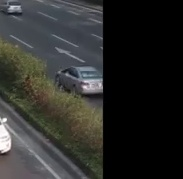

cam2


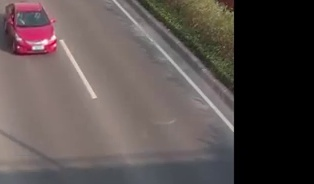

cam2


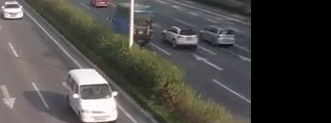

cam2


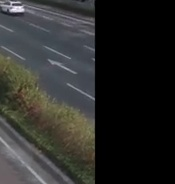

cam2


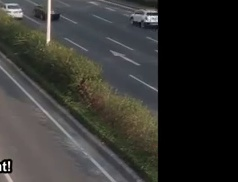

cam2


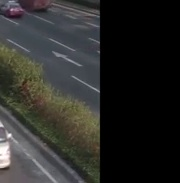

cam2


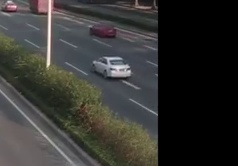

cam2


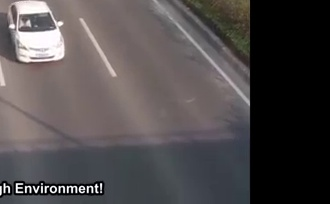

cam2


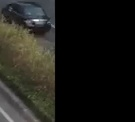

cam2


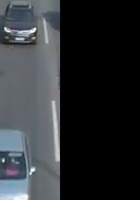

cam2


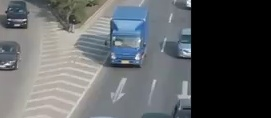

cam2


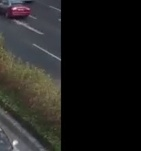

cam2


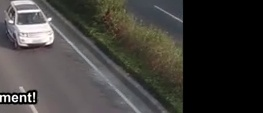

cam2


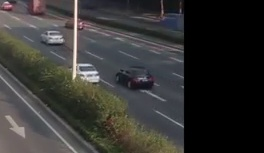

cam2


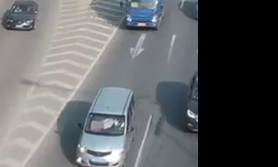

cam2


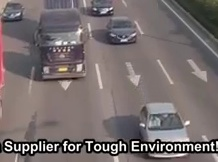

cam2


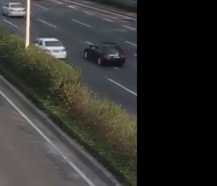

cam2


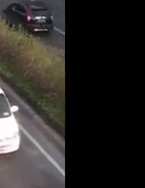

cam2


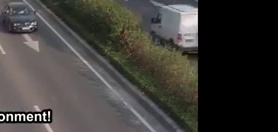

cam2


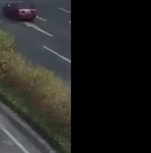

cam2


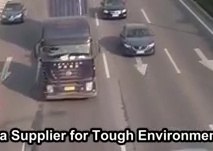

cam2


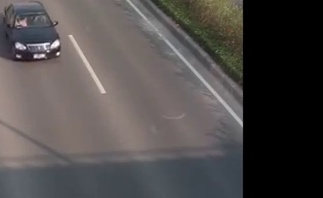

cam2


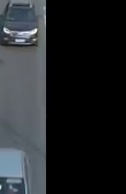

cam2


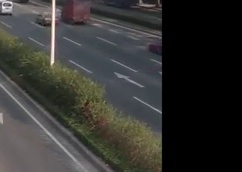

cam2


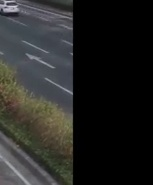

cam2


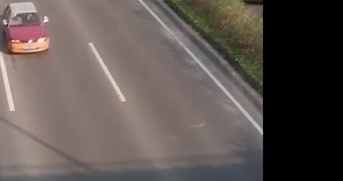

cam2


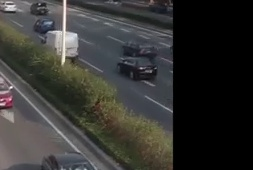

cam2


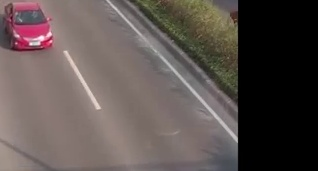

cam2


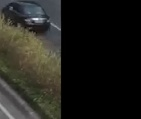

cam2


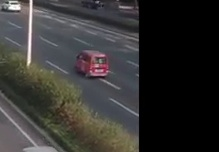

cam2


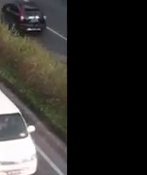

cam2


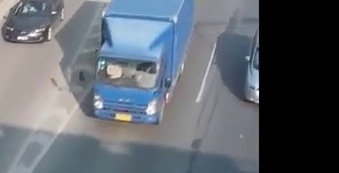

cam2


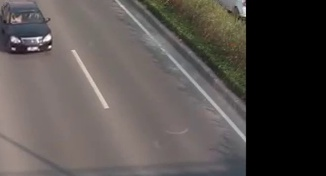

cam2


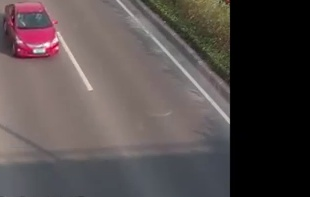

cam2


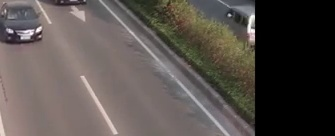

cam2


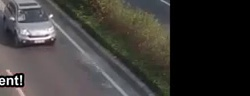

cam2


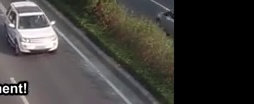

cam2


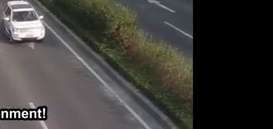

cam2


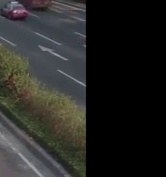

cam2


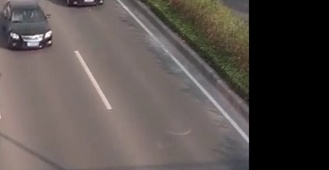

cam2


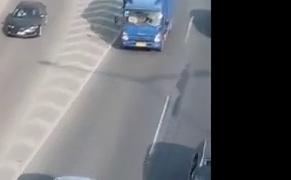

cam2


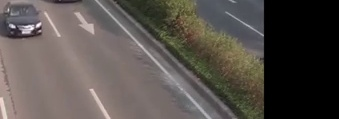

cam2


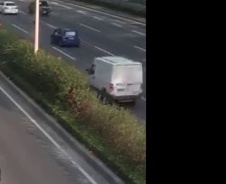

cam2


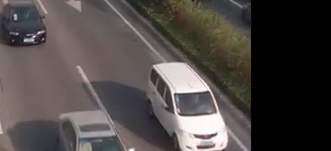

cam2


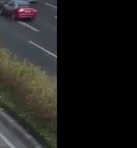

cam2


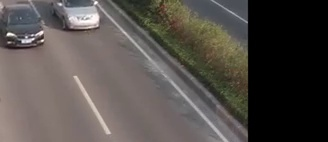

cam2


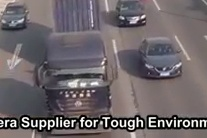

cam2


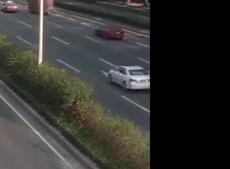

cam2


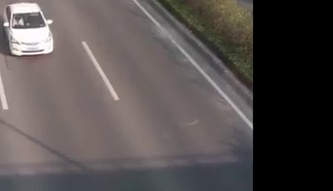

cam2


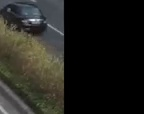

cam2


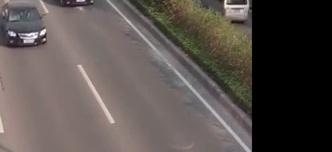

cam2


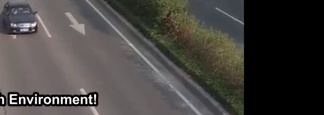

cam2


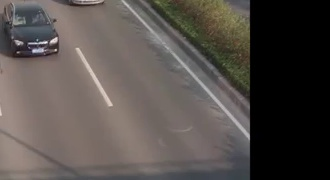

cam2


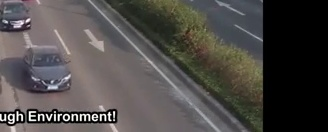

cam2


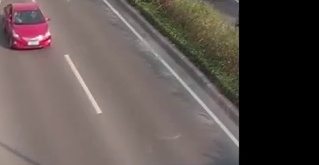

cam2


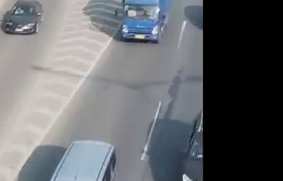

cam2


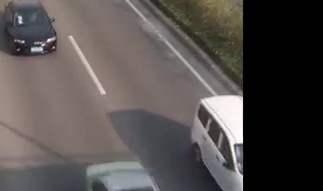

cam2


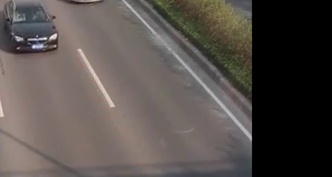

cam2


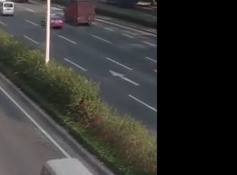

cam2


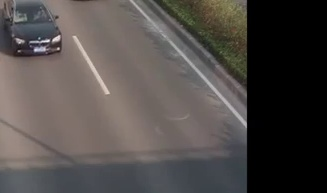

cam2


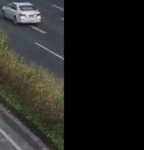

cam2


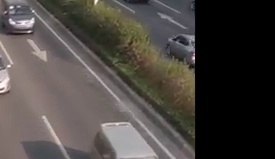

cam2


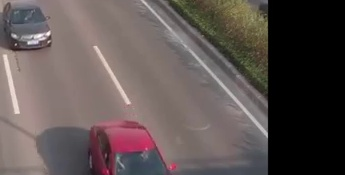

cam2


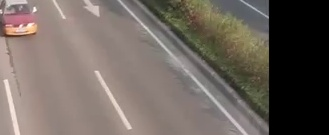

cam2


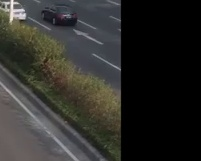

cam2


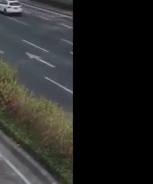

cam2


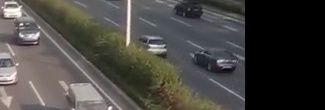

cam2


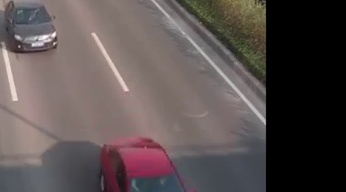

cam2


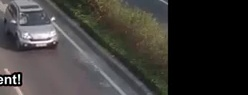

cam2


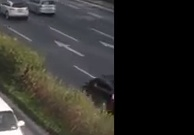

cam2


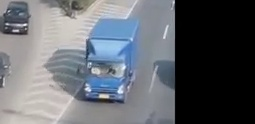

cam2


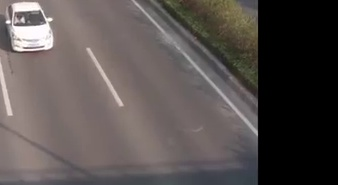

cam2


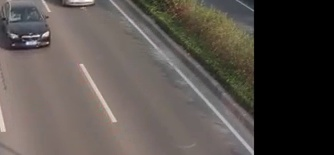

cam2


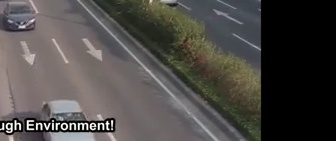

cam2


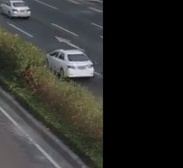

cam2


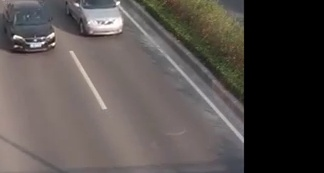

cam2


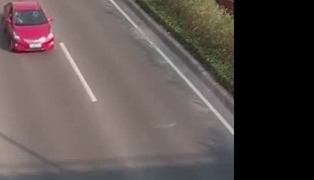

cam2


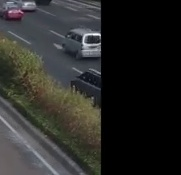

cam2


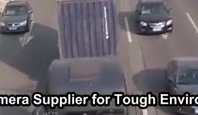

cam2


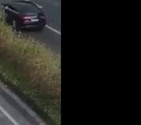

cam2


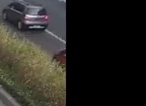

cam2


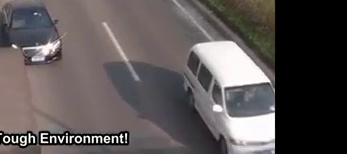

cam2


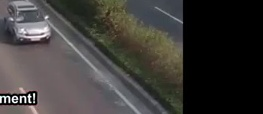

cam2


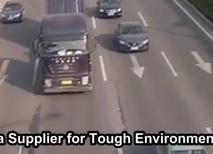

cam2


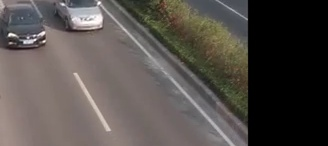

cam2


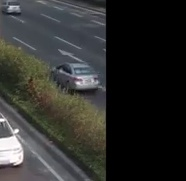

cam2


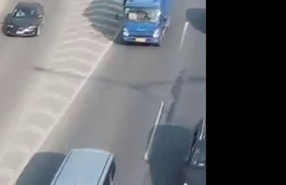

cam2


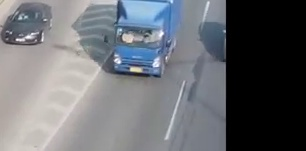

cam2


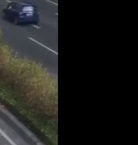

cam2


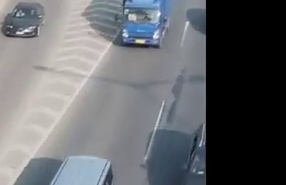

cam2


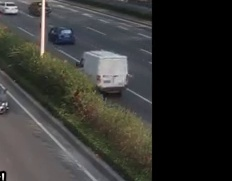

cam2


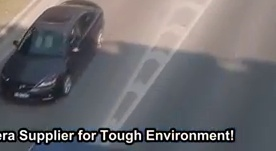

cam2


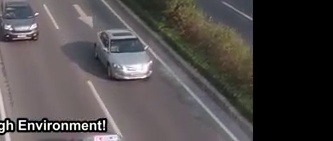

cam2


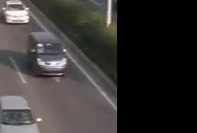

cam2


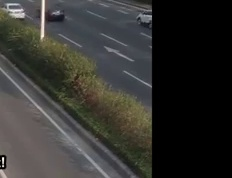

cam2


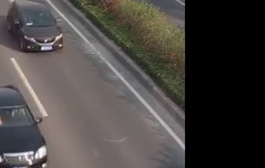

cam2


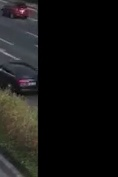

cam2


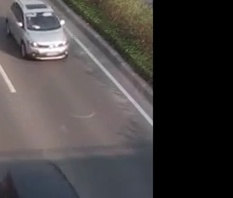

cam2


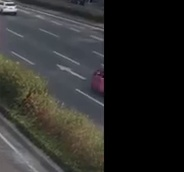

cam2


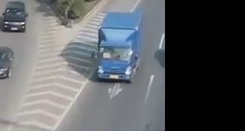

cam2


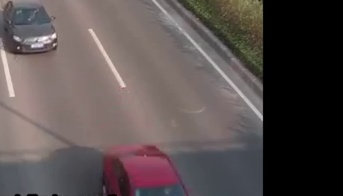

cam2


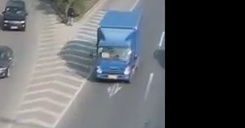

cam2


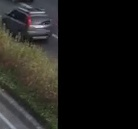

cam2


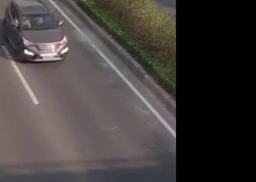

cam2


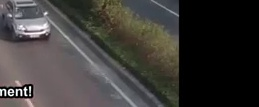

cam2


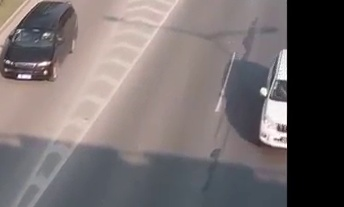

cam2


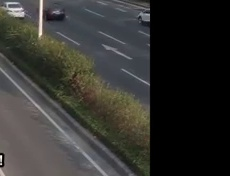

cam2


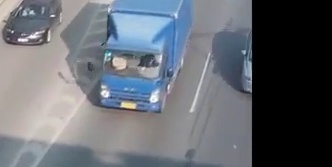

cam2


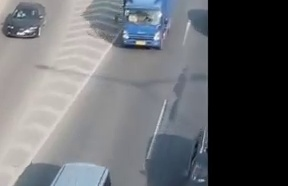

cam2


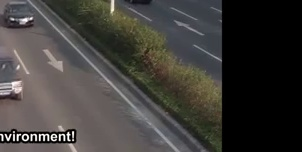

cam2


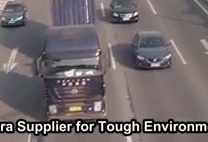

cam2
3
4
0


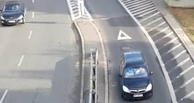

cam3


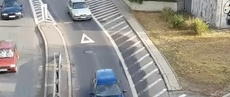

cam3


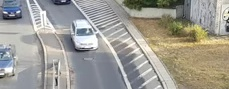

cam3


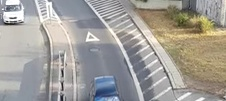

cam3


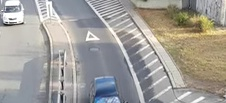

cam3


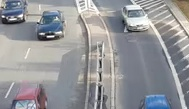

cam3


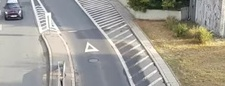

cam3


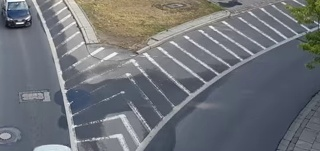

cam3


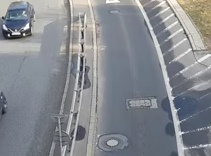

cam3


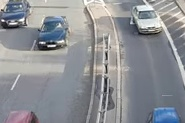

cam3


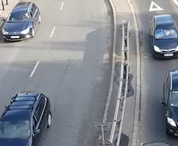

cam3


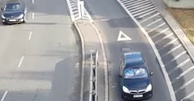

cam3


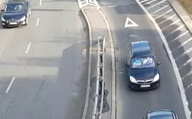

cam3


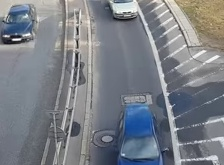

cam3


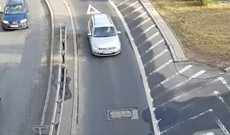

cam3


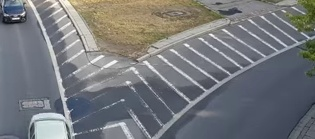

cam3


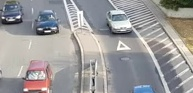

cam3


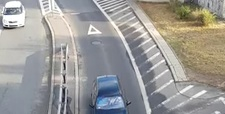

cam3


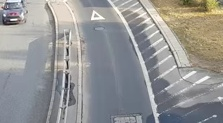

cam3


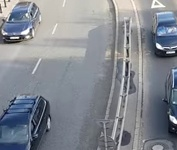

cam3


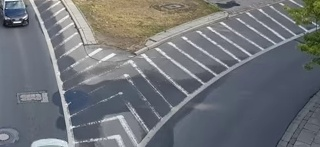

cam3


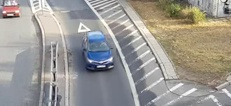

cam3


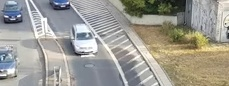

cam3


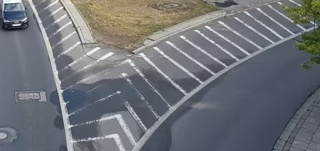

cam3


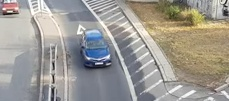

cam3


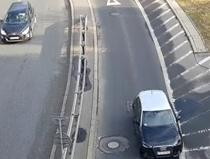

cam3


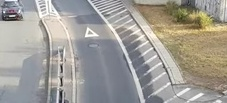

cam3


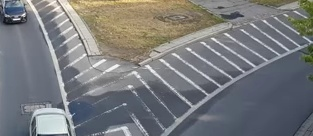

cam3


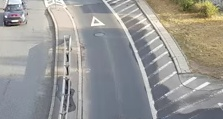

cam3


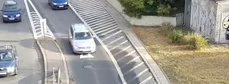

cam3


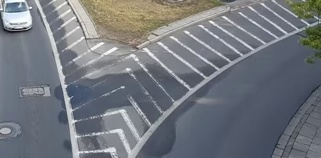

cam3


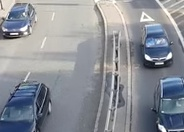

cam3


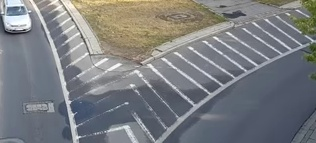

cam3


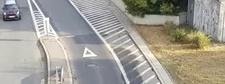

cam3


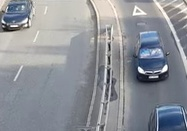

cam3


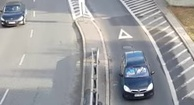

cam3


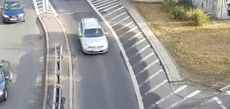

cam3


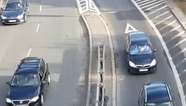

cam3


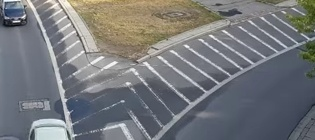

cam3


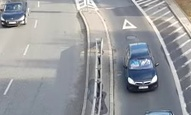

cam3


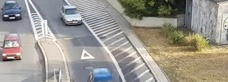

cam3


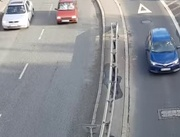

cam3


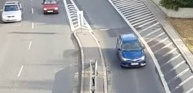

cam3


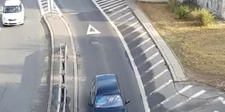

cam3


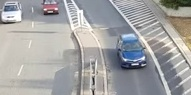

cam3


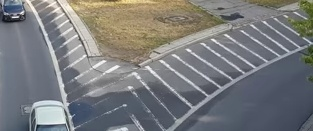

cam3


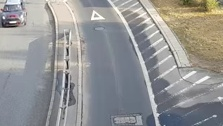

cam3


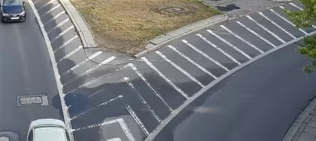

cam3


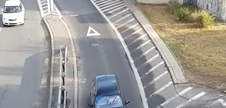

cam3


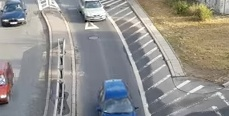

cam3


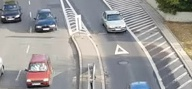

cam3


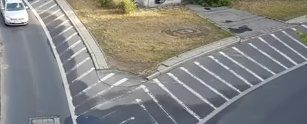

cam3


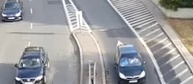

cam3


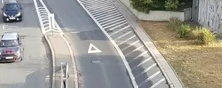

cam3


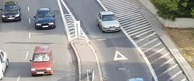

cam3


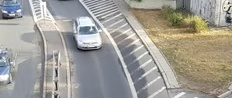

cam3


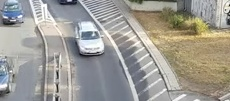

cam3


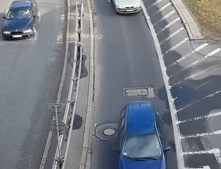

cam3


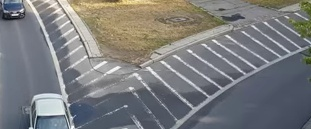

cam3


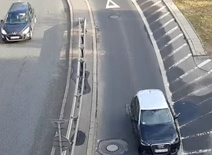

cam3


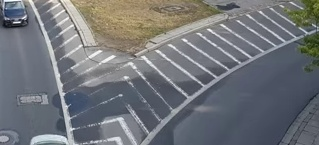

cam3


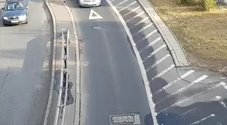

cam3


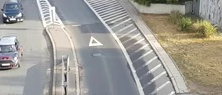

cam3


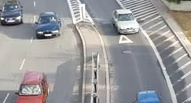

cam3


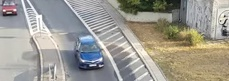

cam3


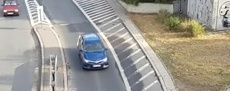

cam3


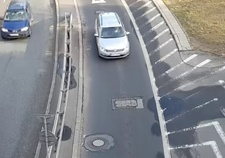

cam3


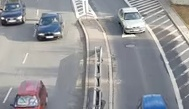

cam3


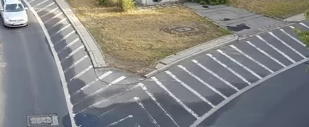

cam3


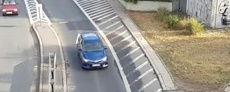

cam3


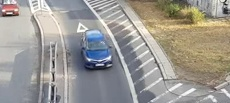

cam3


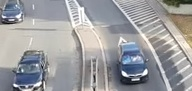

cam3


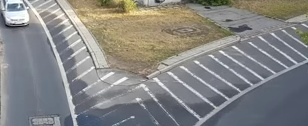

cam3


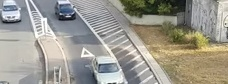

cam3


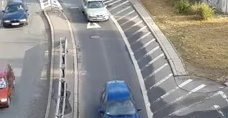

cam3


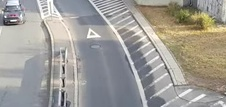

cam3


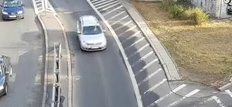

cam3


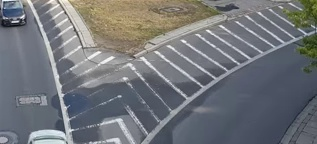

cam3


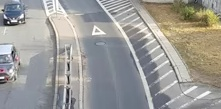

cam3


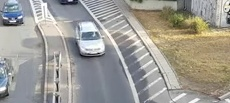

cam3


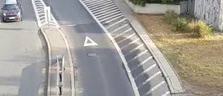

cam3


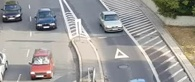

cam3


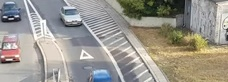

cam3


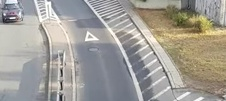

cam3


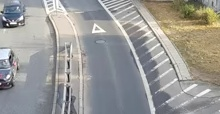

cam3


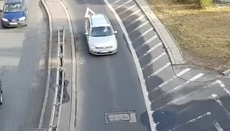

cam3


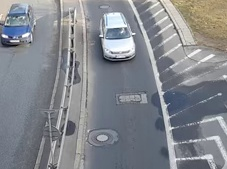

cam3


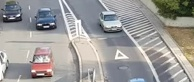

cam3


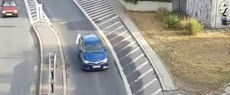

cam3


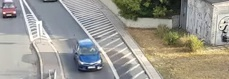

cam3


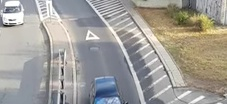

cam3


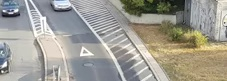

cam3


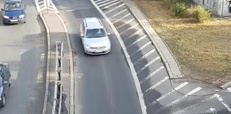

cam3


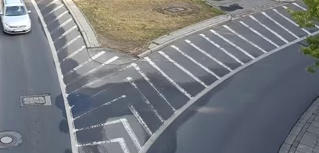

cam3


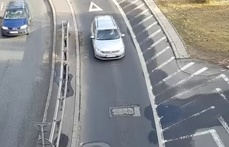

cam3


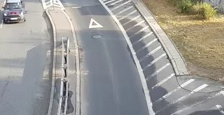

cam3


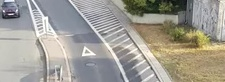

cam3


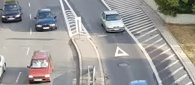

cam3


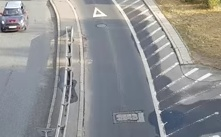

cam3


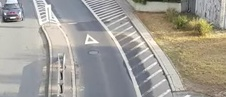

cam3


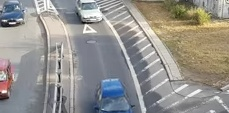

cam3


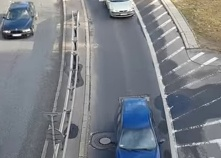

cam3


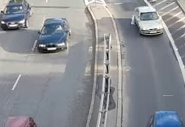

cam3


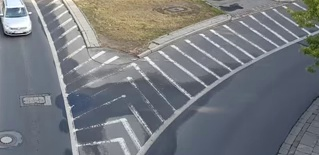

cam3


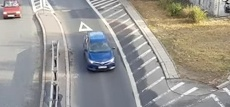

cam3


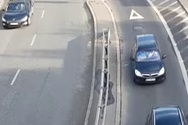

cam3


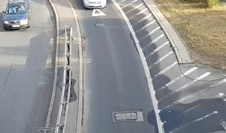

cam3


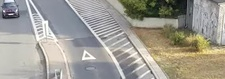

cam3


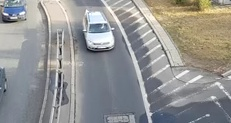

cam3


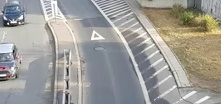

cam3


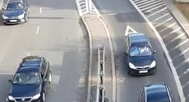

cam3


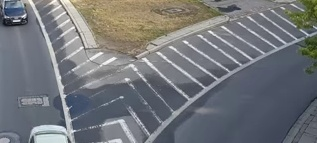

cam3


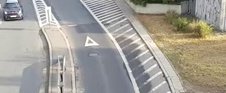

cam3


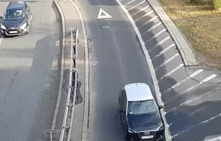

cam3


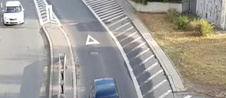

cam3


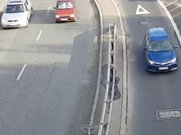

cam3


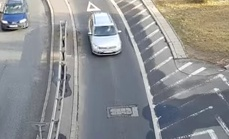

cam3


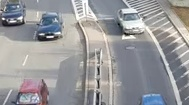

cam3


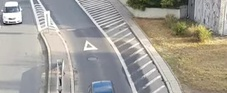

cam3


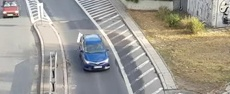

cam3


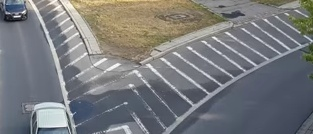

cam3


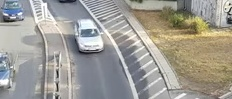

cam3


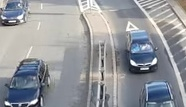

cam3


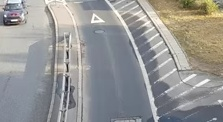

cam3


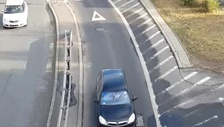

cam3


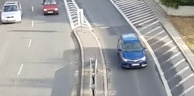

cam3


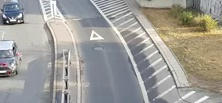

cam3


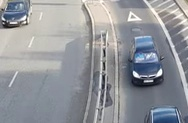

cam3


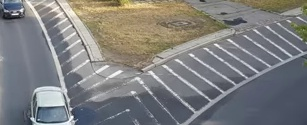

cam3


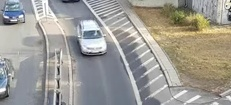

cam3


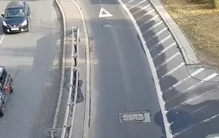

cam3


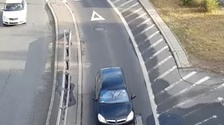

cam3


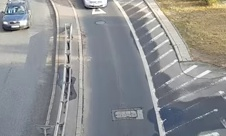

cam3


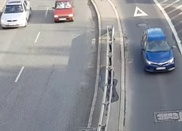

cam3


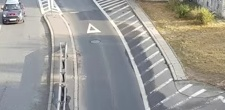

cam3


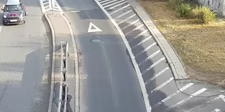

cam3


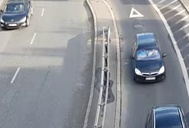

cam3


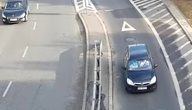

cam3


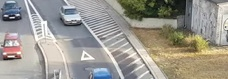

cam3
1


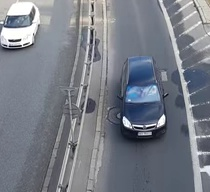

cam3


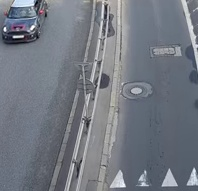

cam3


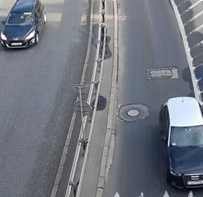

cam3


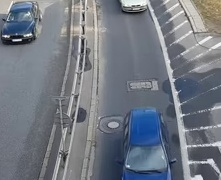

cam3


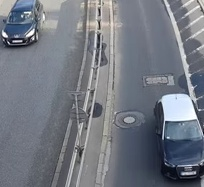

cam3


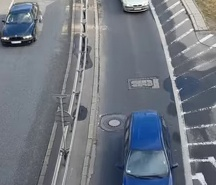

cam3


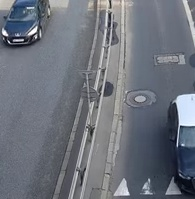

cam3


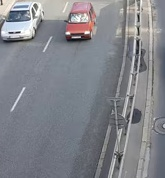

cam3


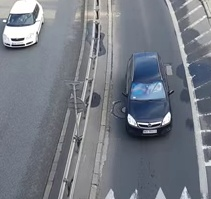

cam3


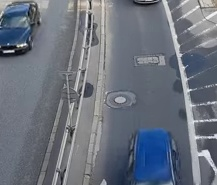

cam3


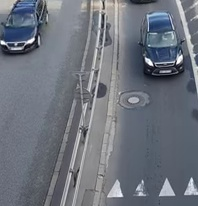

cam3


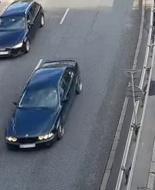

cam3


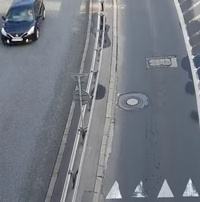

cam3


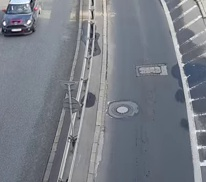

cam3


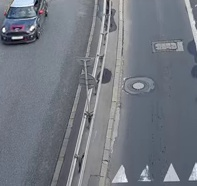

cam3


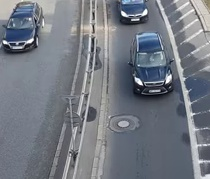

cam3


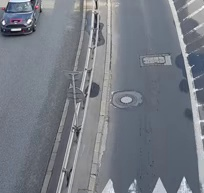

cam3


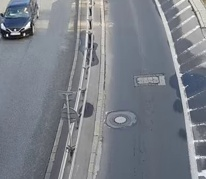

cam3


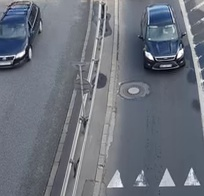

cam3


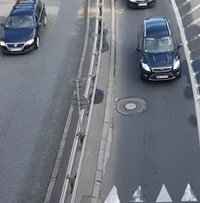

cam3


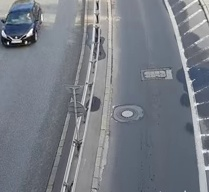

cam3


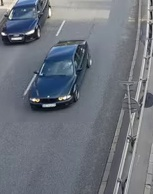

cam3


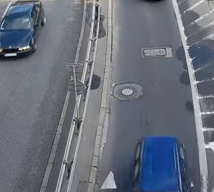

cam3


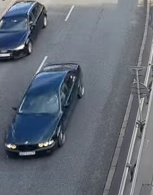

cam3


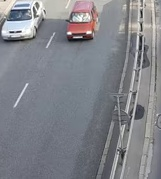

cam3


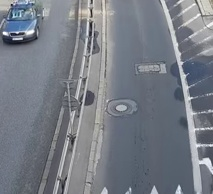

cam3


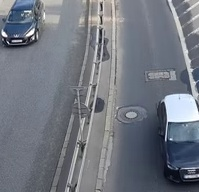

cam3


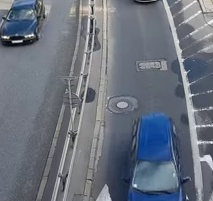

cam3


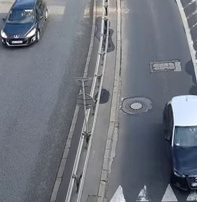

cam3


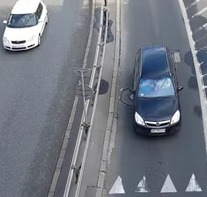

cam3


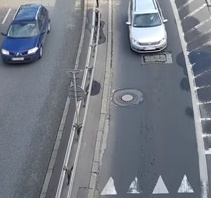

cam3


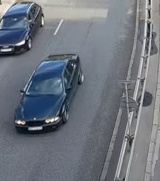

cam3
2


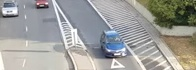

cam3


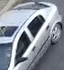

cam3


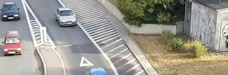

cam3


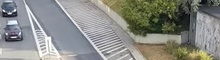

cam3


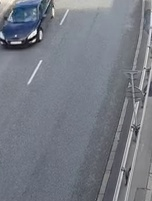

cam3


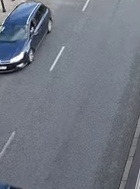

cam3


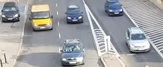

cam3


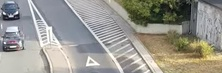

cam3


cam3


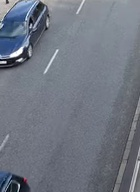

cam3


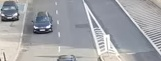

cam3


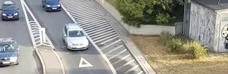

cam3


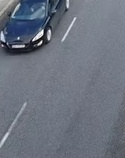

cam3


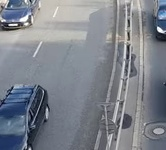

cam3


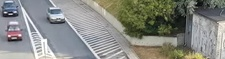

cam3


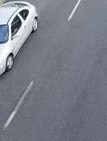

cam3


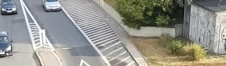

cam3


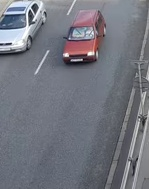

cam3


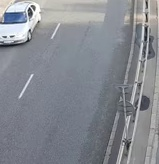

cam3


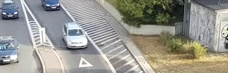

cam3


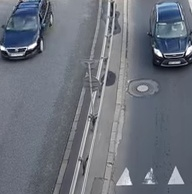

cam3


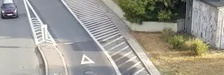

cam3


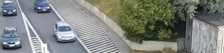

cam3


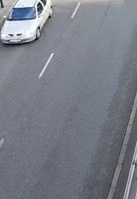

cam3


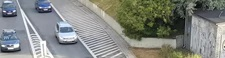

cam3


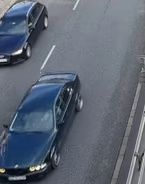

cam3


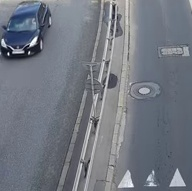

cam3


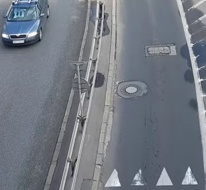

cam3


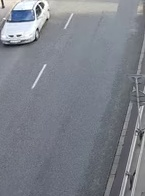

cam3


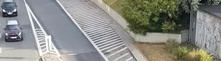

cam3


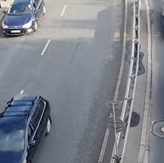

cam3


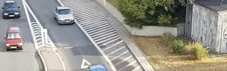

cam3


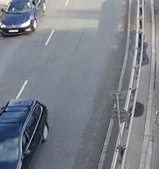

cam3


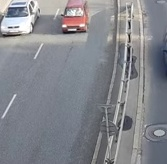

cam3


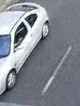

cam3


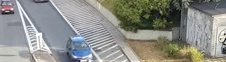

cam3


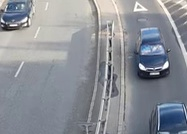

cam3


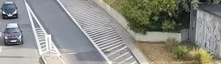

cam3


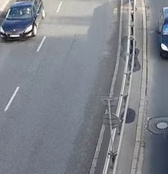

cam3


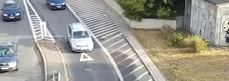

cam3


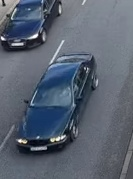

cam3


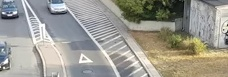

cam3


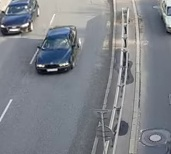

cam3


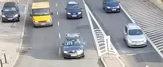

cam3


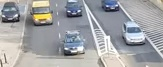

cam3


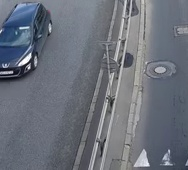

cam3


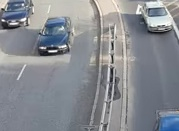

cam3


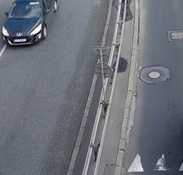

cam3


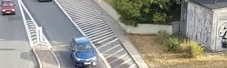

cam3


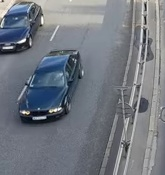

cam3


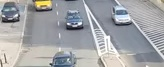

cam3


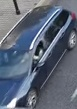

cam3


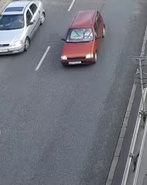

cam3


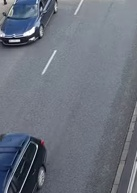

cam3


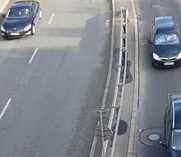

cam3


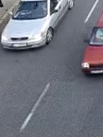

cam3


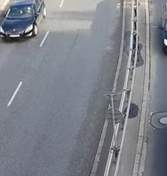

cam3


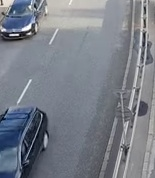

cam3


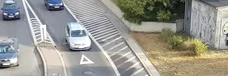

cam3


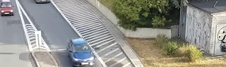

cam3


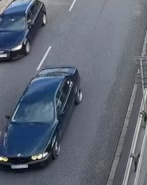

cam3


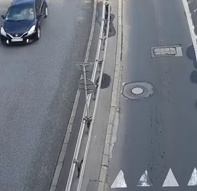

cam3


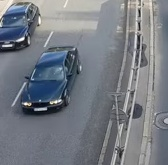

cam3


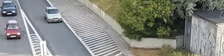

cam3


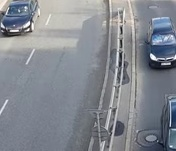

cam3


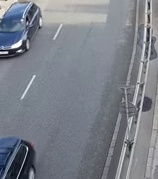

cam3


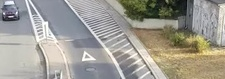

cam3


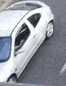

cam3


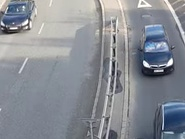

cam3


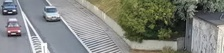

cam3


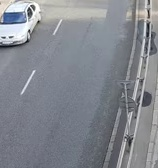

cam3


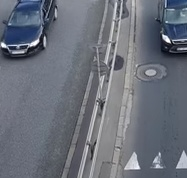

cam3


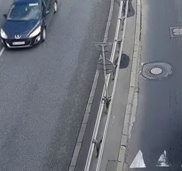

cam3


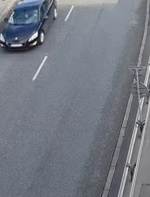

cam3


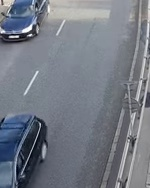

cam3


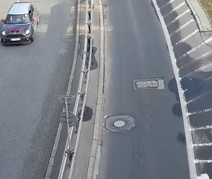

cam3


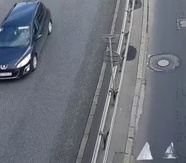

cam3


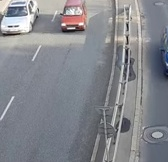

cam3


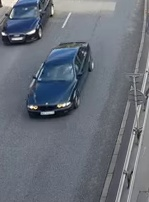

cam3


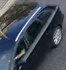

cam3


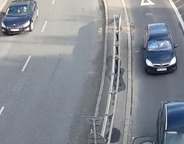

cam3


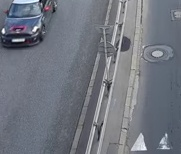

cam3


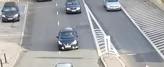

cam3


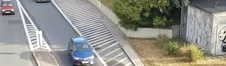

cam3


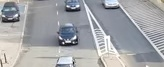

cam3


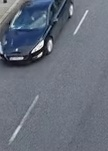

cam3


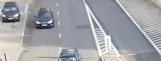

cam3


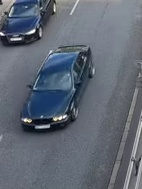

cam3


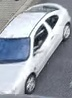

cam3


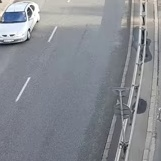

cam3


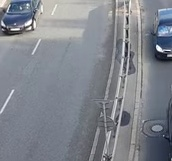

cam3


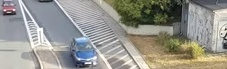

cam3


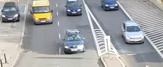

cam3


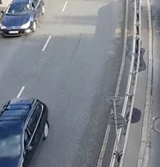

cam3


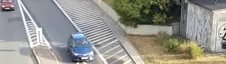

cam3


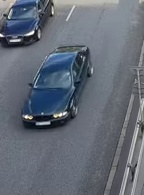

cam3


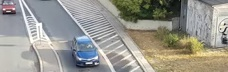

cam3


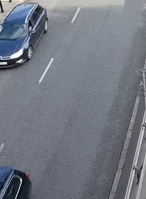

cam3


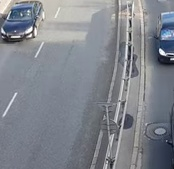

cam3


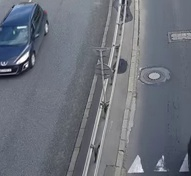

cam3


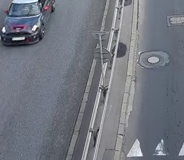

cam3


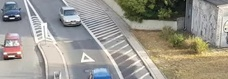

cam3


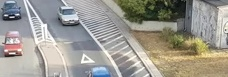

cam3


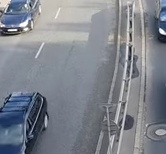

cam3


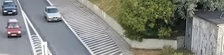

cam3


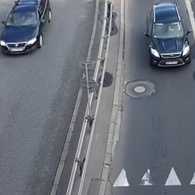

cam3


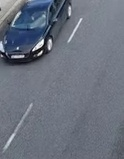

cam3


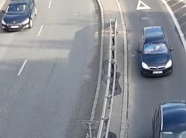

cam3


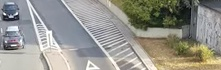

cam3


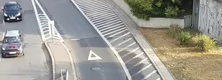

cam3


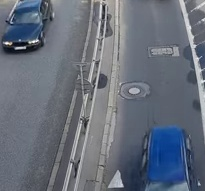

cam3


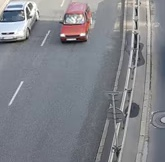

cam3


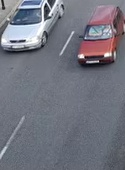

cam3


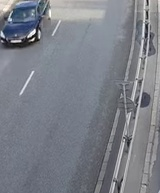

cam3


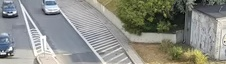

cam3


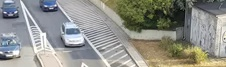

cam3


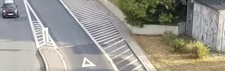

cam3


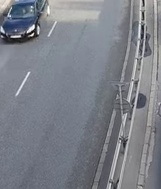

cam3


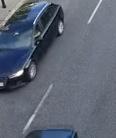

cam3


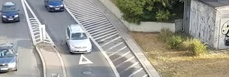

cam3


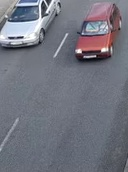

cam3


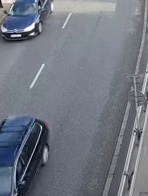

cam3


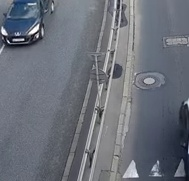

cam3


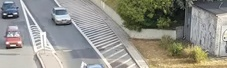

cam3


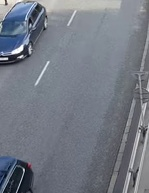

cam3


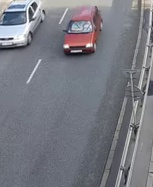

cam3


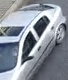

cam3


cam3


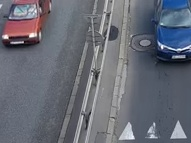

cam3


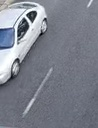

cam3


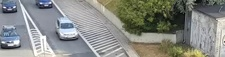

cam3


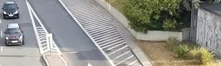

cam3


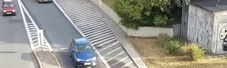

cam3


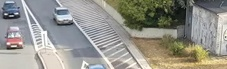

cam3


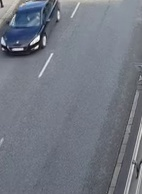

cam3


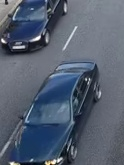

cam3


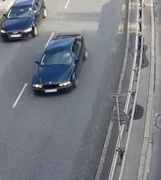

cam3


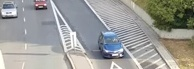

cam3


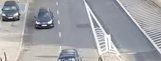

cam3


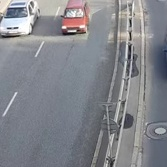

cam3


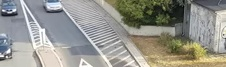

cam3


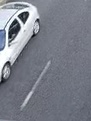

cam3


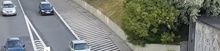

cam3


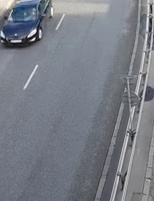

cam3


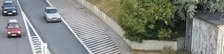

cam3


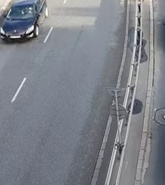

cam3


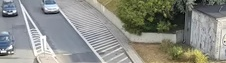

cam3


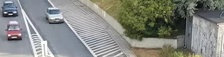

cam3


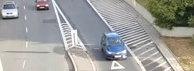

cam3


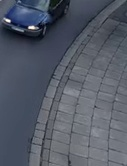

cam3


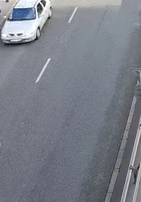

cam3


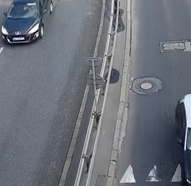

cam3


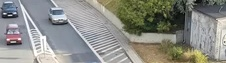

cam3


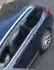

cam3


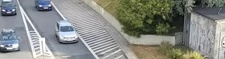

cam3


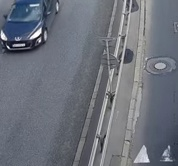

cam3


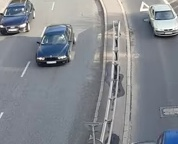

cam3


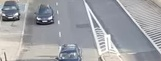

cam3


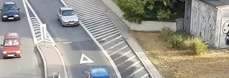

cam3


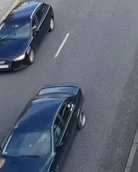

cam3


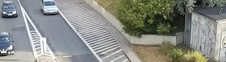

cam3


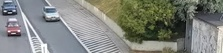

cam3


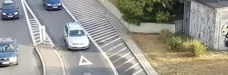

cam3


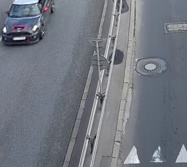

cam3


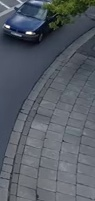

cam3


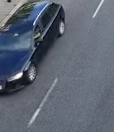

cam3


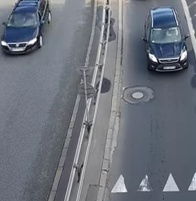

cam3


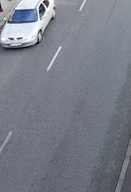

cam3


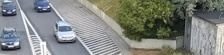

cam3


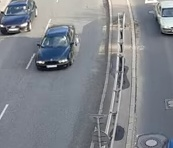

cam3


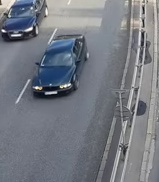

cam3


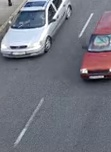

cam3


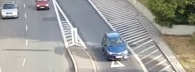

cam3


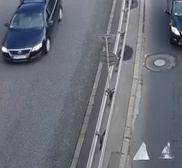

cam3


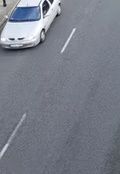

cam3
3
4


In [25]:
for folder in folders:
    for cluster in clusters.keys():
        print(cluster)
        for img_ind in clusters[cluster]:
            try:
                display(Image(filename=img_path + '/' +folder  + '/' + onlyfiles[img_ind]))
                print(folder)
            except:
                pass

In [ ]:
# count = 0;
# for imageName in onlyfiles: #assuming JPG
#     display(Image(filename=img_path + '/' + imageName))
#     print(imageName)